In [1]:
from ultralytics import YOLO
import cv2
import torch

In [2]:
try:
    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"Using device: {device}")

    # Load the YOLO model onto the selected device
    model = YOLO("../Data-to-clone/runs/detect/My-Model3/weights/best.pt").to(device)
    print("Model loaded successfully.")
except Exception as e:
    print(f"Error in loading model or setting device: {e}")


Using device: cuda
Model loaded successfully.


In [3]:
imgValid = "test/images/all_0_1142_png.rf.4ba726be944734d8df455b77cc49a54f.jpg"

# Load image
try:
    img = cv2.imread(imgValid)
    if img is None:
        raise FileNotFoundError(f"Image file '{imgValid}' not found.")
    
    # Get image dimensions
    H, W, _ = img.shape
    print(f"Image loaded successfully with dimensions: {H}x{W}")
except Exception as e:
    print(f"Error in loading or processing image: {e}")


Image loaded successfully with dimensions: 350x350


In [4]:
imgPredict = img.copy()

try:
    results = model(imgPredict)[0]
    print("Inference completed successfully.")
except Exception as e:
    print(f"Error during model inference: {e}")



0: 352x352 2 Fractures, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 2.3ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.


In [5]:
# Draw bounding boxes on predictions
try:
    threshold = 0.5
    for result in results.boxes.data.tolist():
        x1, y1, x2, y2, score, class_id = result

        if score > threshold:
            cv2.rectangle(imgPredict, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 1)
    print("Bounding boxes drawn on predictions.")
except Exception as e:
    print(f"Error drawing bounding boxes: {e}")


Bounding boxes drawn on predictions.


In [6]:
# Path to the annotations file
imgLabels = "test/labels/all_0_1142_png.rf.4ba726be944734d8df455b77cc49a54f.txt"

# Load annotations
annotations = []
try:
    with open(imgLabels, 'r') as f:
        lines = f.readlines()

    for line in lines:
        values = line.split()
        label = values[0]
        x, y, w, h = map(float, values[1:])
        annotations.append((label, x, y, w, h))
    print("Annotations loaded successfully.")
except FileNotFoundError:
    print(f"Label file '{imgLabels}' does not exist.")
except Exception as e:
    print(f"Error loading or processing annotations: {e}")


Annotations loaded successfully.


In [7]:
# Draw bounding boxes for ground truth
try:
    for annotation in annotations:
        label, x, y, w, h = annotation
        class_name = model.names[int(label)].upper() if int(label) < len(model.names) else "UNKNOWN"

        x1 = int((x - w / 2) * W)
        y1 = int((y - h / 2) * H)
        x2 = int((x + w / 2) * W)
        y2 = int((y + h / 2) * H)

        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 1)
        cv2.putText(img, class_name, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)
    print("Bounding boxes drawn for ground truth annotations.")
except Exception as e:
    print(f"Error drawing ground truth bounding boxes: {e}")


Bounding boxes drawn for ground truth annotations.


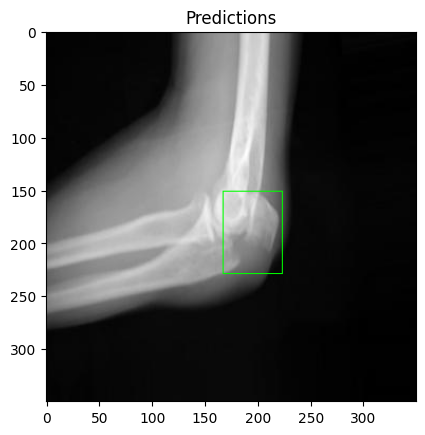

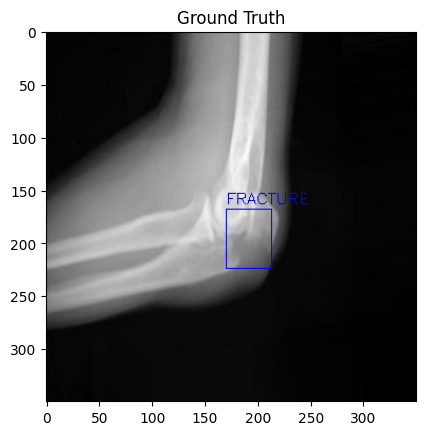

Images displayed successfully.


In [8]:
import matplotlib.pyplot as plt

try:
    # Display prediction image
    plt.imshow(cv2.cvtColor(imgPredict, cv2.COLOR_BGR2RGB))
    plt.title("Predictions")
    plt.show()

    # Display ground truth image
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Ground Truth")
    plt.show()

    print("Images displayed successfully.")
except Exception as e:
    print(f"Error displaying images: {e}")


Using device: cuda
Processing test/images/all_0_1142_png.rf.4ba726be944734d8df455b77cc49a54f.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


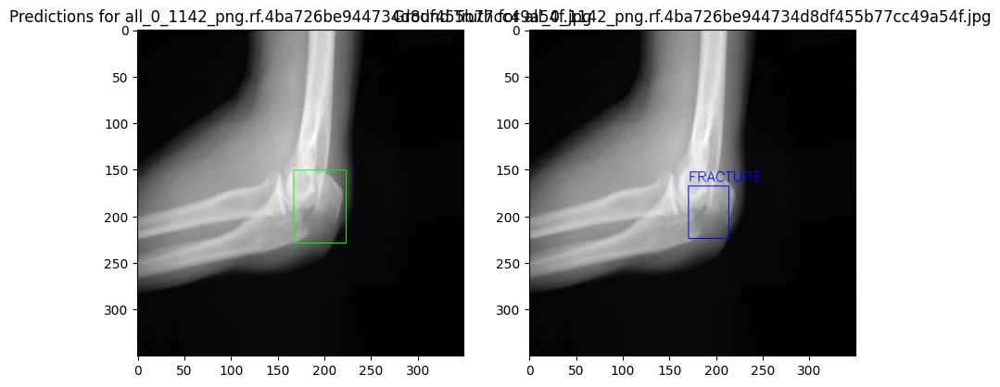

Processing test/images/all_0_1640_png.rf.b2d829f022772b47dd885f984ea1de26.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


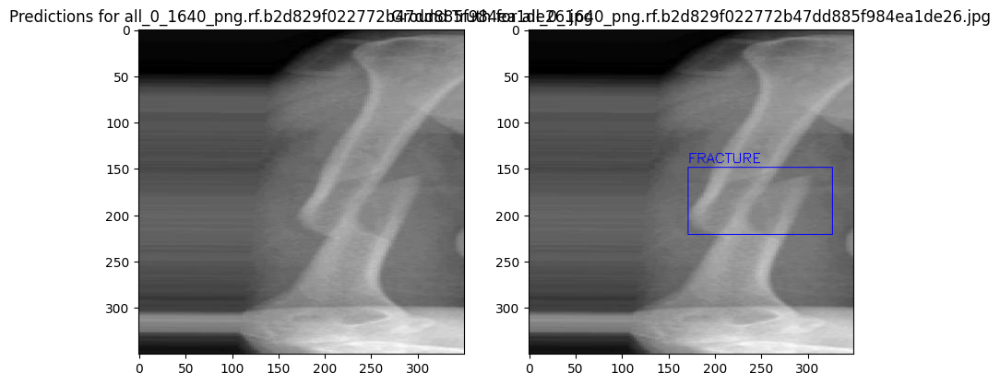

Processing test/images/all_0_2324_png.rf.64c3541a9e2a4eafb1730138f27ac1e5.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.2ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


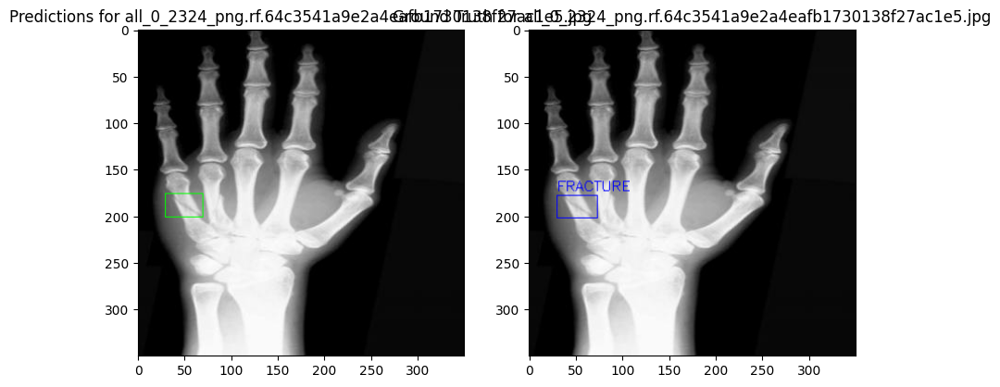

Processing test/images/all_0_380_png.rf.fa22386768cd9d7890a7b020de3bbaac.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


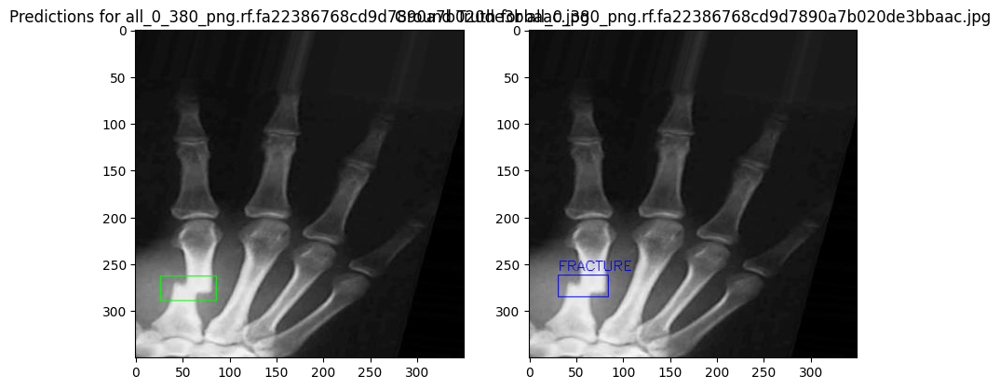

Processing test/images/all_0_4820_png.rf.c0bd605d0b593684e48ad4ce85ff137e.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


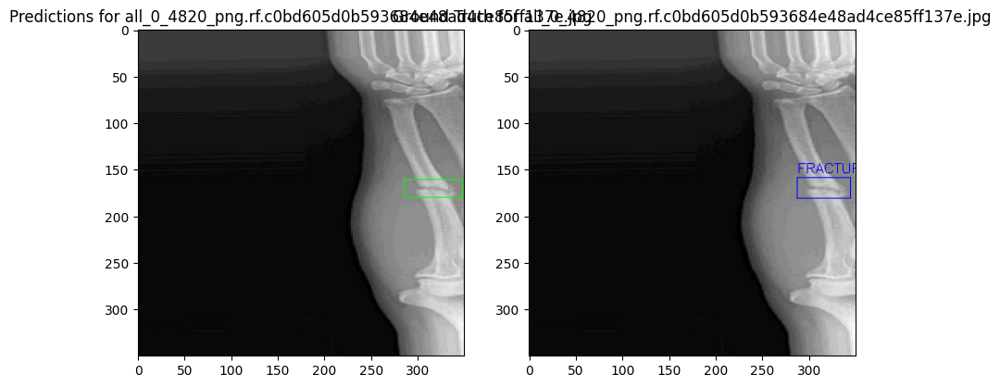

Processing test/images/all_0_4881_png.rf.8af4d3b5177af309f2670a7e5a34ad27.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


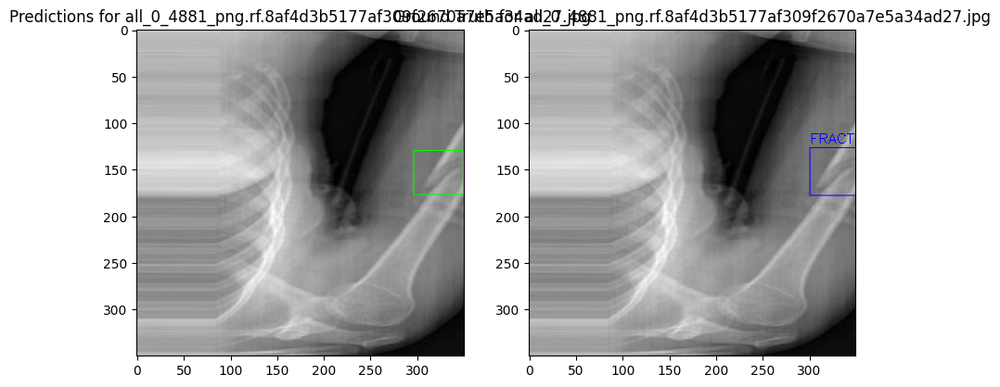

Processing test/images/all_0_5347_png.rf.f79672b5a39afa8528d35257b3aa0803.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


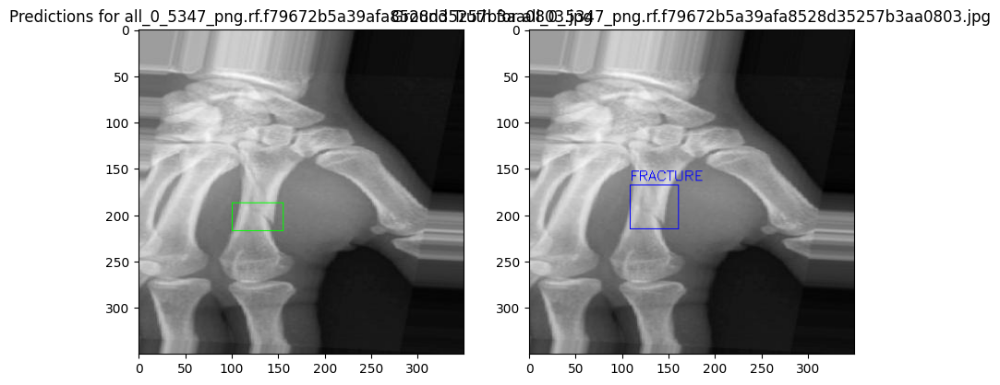

Processing test/images/all_0_5468_png.rf.e32d0c5d3297880edb7e637e6a169de9.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


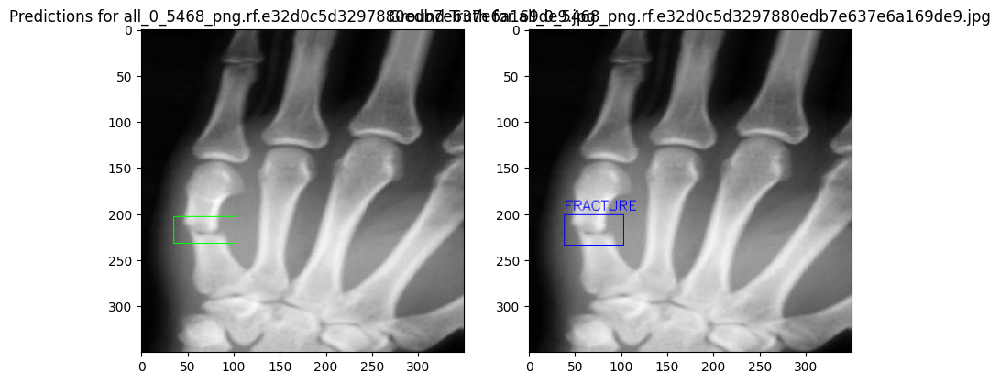

Processing test/images/all_0_6868_png.rf.7f0499c7473adeaf09de0fe073ad1525.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


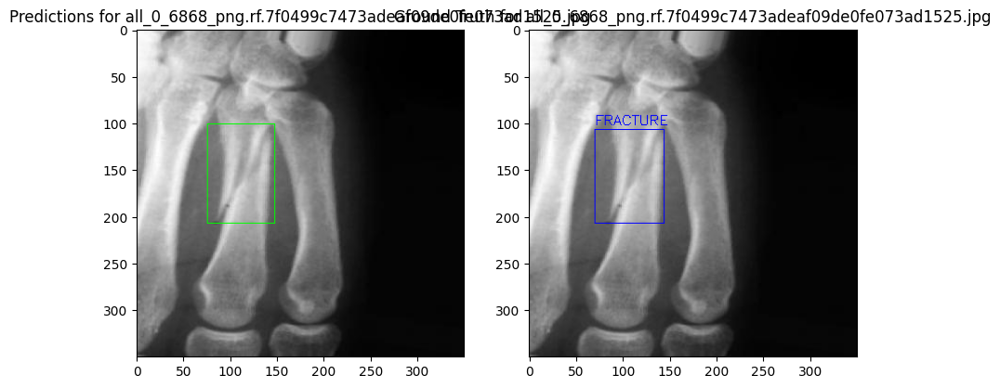

Processing test/images/all_0_7218_png.rf.c23e459ff506f2df0509ce978e9ffbcb.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


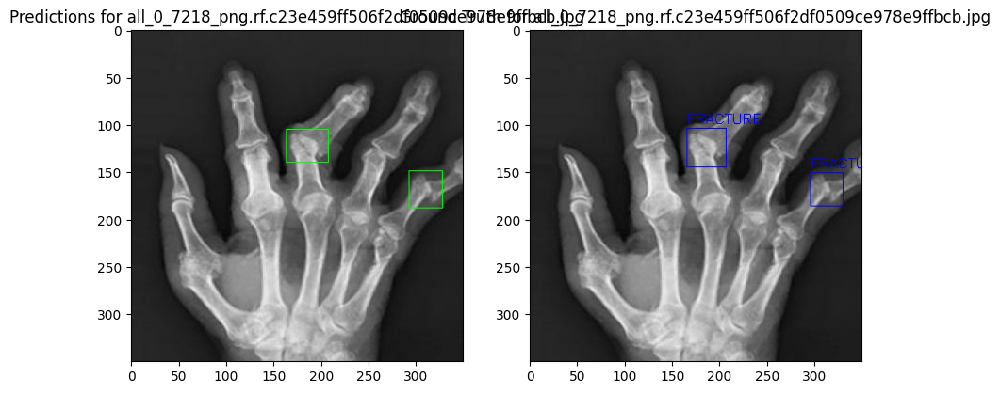

Processing test/images/all_0_7827_png.rf.1741c72fa9061f28e02aef19f42b32b3.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.4ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


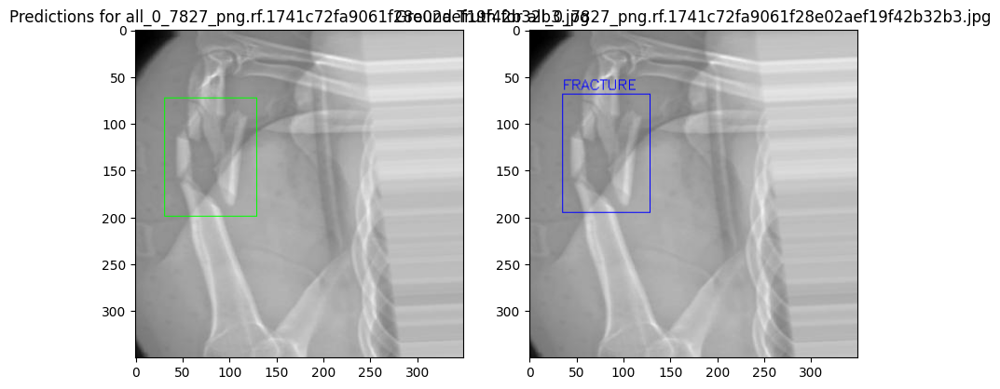

Processing test/images/all_0_7968_png.rf.049f36211570a51883b2931b7a40b313.jpg...

0: 352x352 (no detections), 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


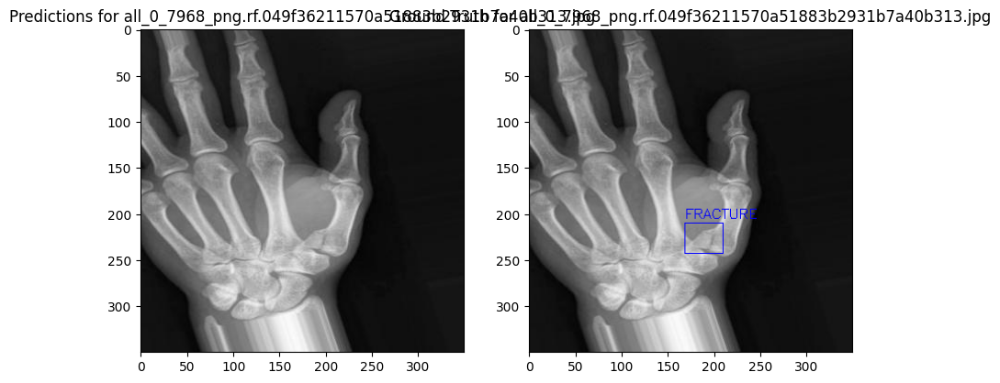

Processing test/images/all_0_8193_png.rf.36973e74ca8d722b10d68b981fb1423d.jpg...

0: 352x352 (no detections), 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


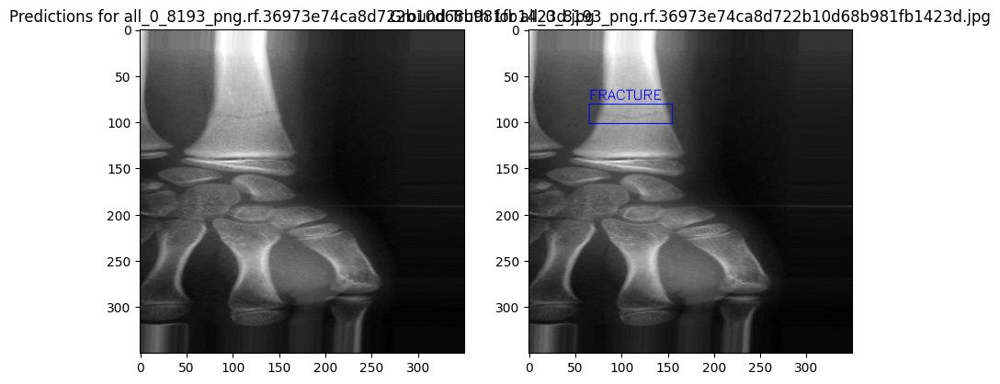

Processing test/images/all_0_8323_png.rf.e0905b4967d69daa21d8ff18cc7903cf.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


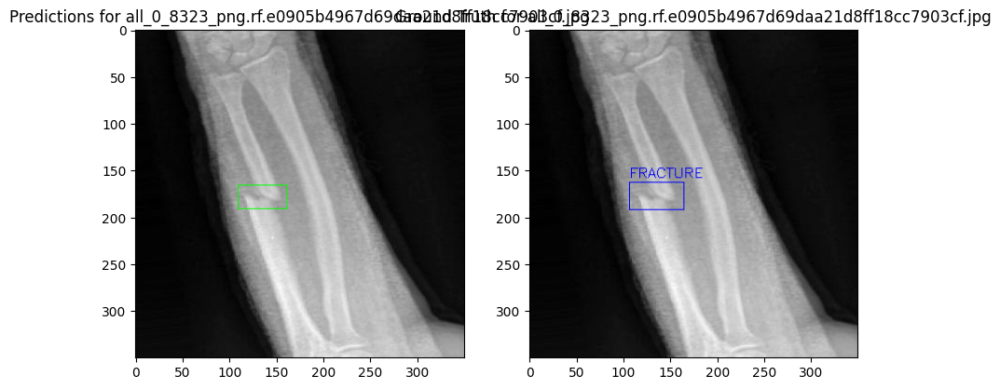

Processing test/images/all_0_8830_png.rf.34736c513d7eb9143cf97be74f4aaf1b.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


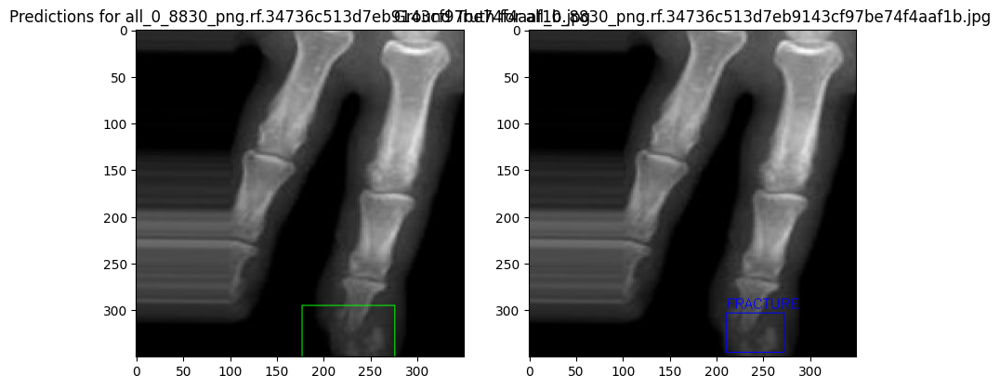

Processing test/images/all_0_9227_png.rf.2ce2cc00d84d4642b7bd247dad99bea4.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.5ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


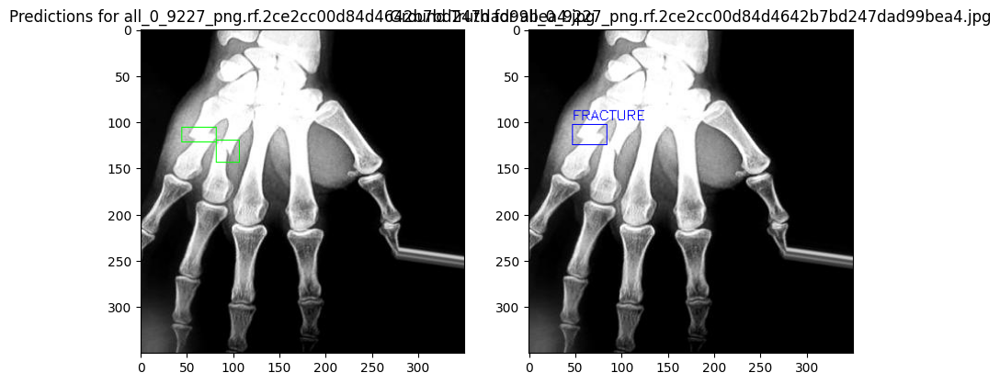

Processing test/images/all_0_936_png.rf.972255c967e6ef426ac11c19f7ea86b9.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.3ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


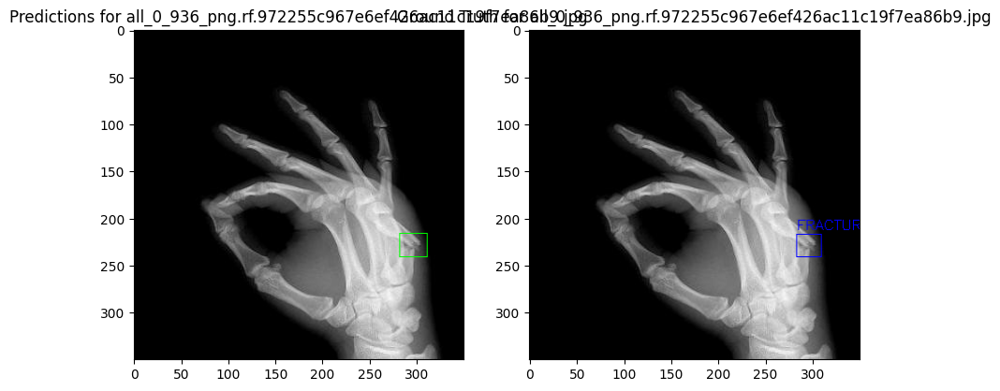

Processing test/images/bri_0_1233_png.rf.f1dfd3d5451f2903f9f8cd3dc8f6be2e.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 0.9ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


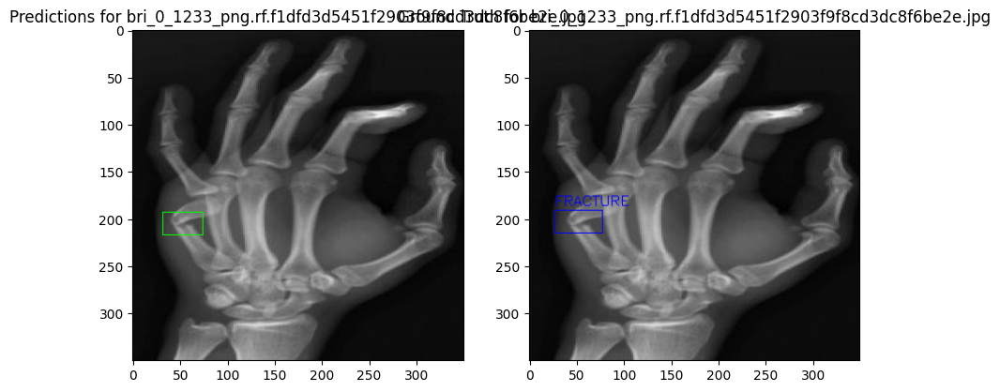

Processing test/images/bri_0_152_png.rf.a3d4cd884aca1dac5f4755afeb1b648f.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


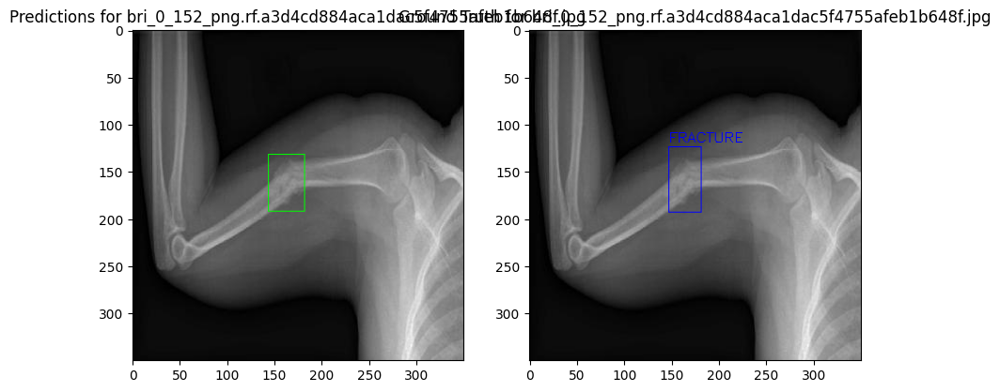

Processing test/images/bri_0_1772_png.rf.655b8cf6be49a337aea59dce59af5002.jpg...

0: 352x352 3 Fractures, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


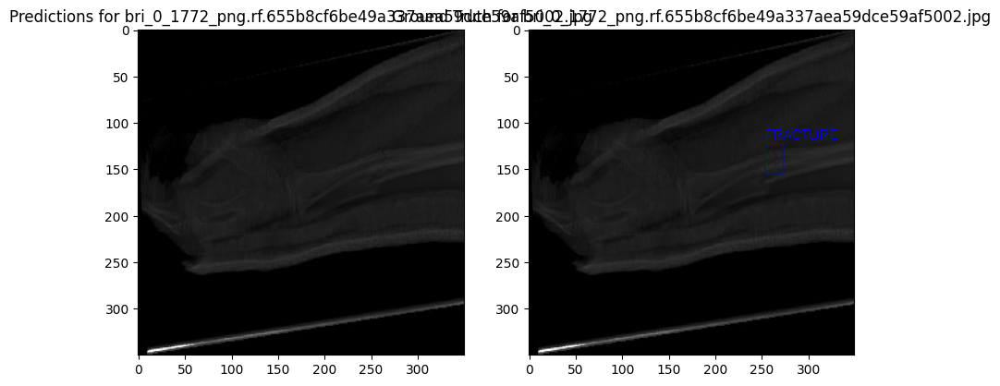

Processing test/images/bri_0_1845_png.rf.9aa5d8c914d267e2204064837e1d5817.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


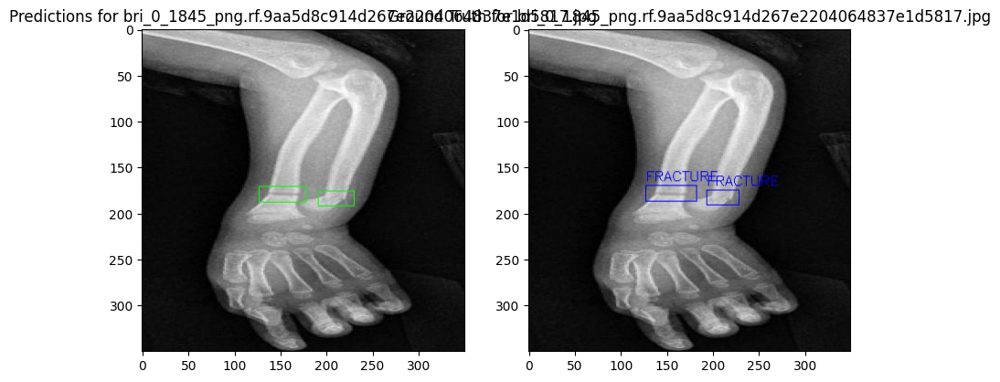

Processing test/images/bri_0_2228_png.rf.482d6844bc383ab468f83def7238961b.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.2ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


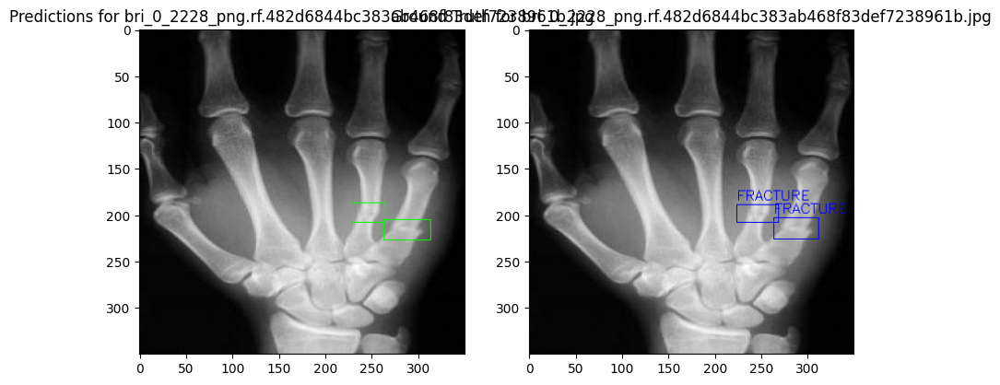

Processing test/images/bri_0_3100_png.rf.134cd4027e4322a6d17e25128e423634.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


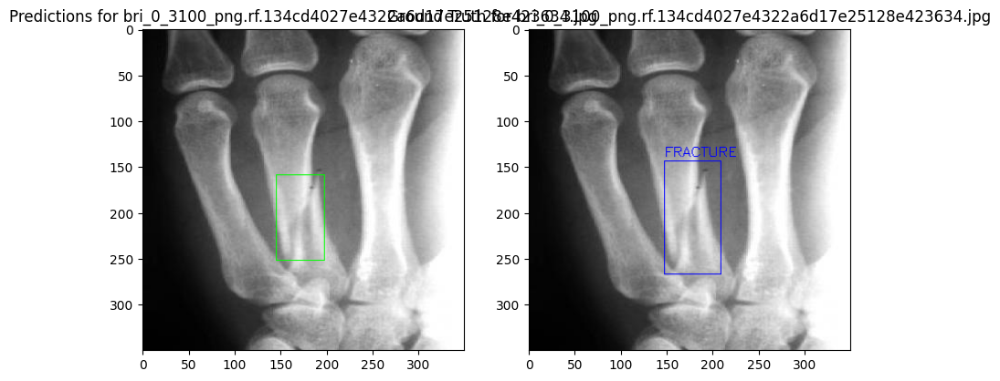

Processing test/images/bri_0_4448_png.rf.64900615a6961267b91682168abdcfe5.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


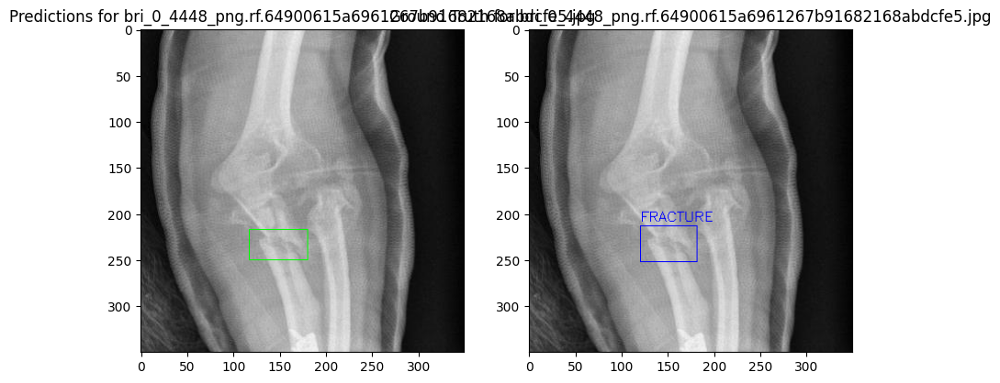

Processing test/images/bri_0_479_png.rf.e9c486152ca7161477a8c83097cf7299.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


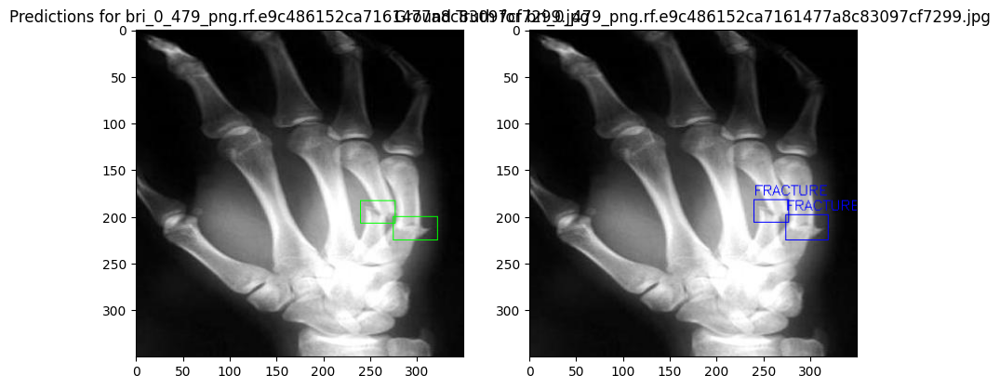

Processing test/images/bri_0_4835_png.rf.c782a22171d7f5a409fe9bf80ed74605.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.3ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


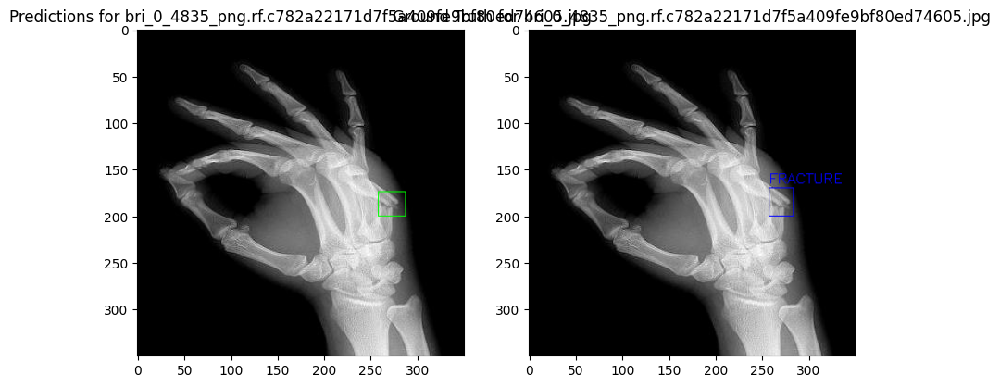

Processing test/images/bri_0_5010_png.rf.4021d972ce8adb1e014f967714055bb1.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


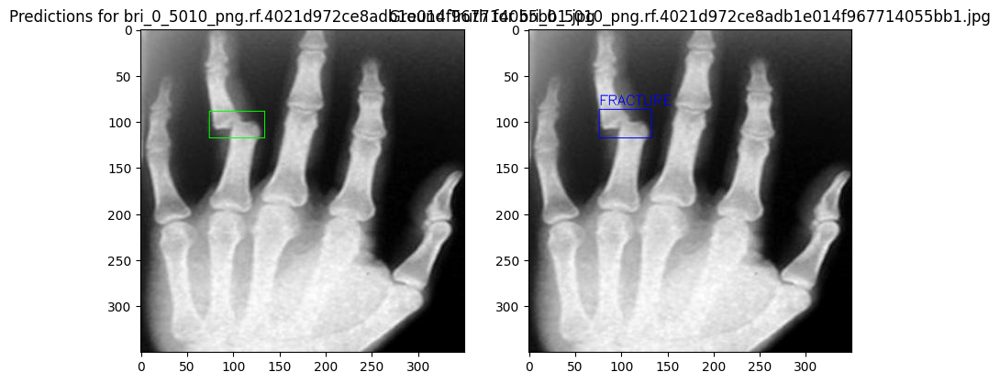

Processing test/images/bri_0_5075_png.rf.198dd6d1ae49bd554fcbb3c3c04c73f5.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 0.9ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


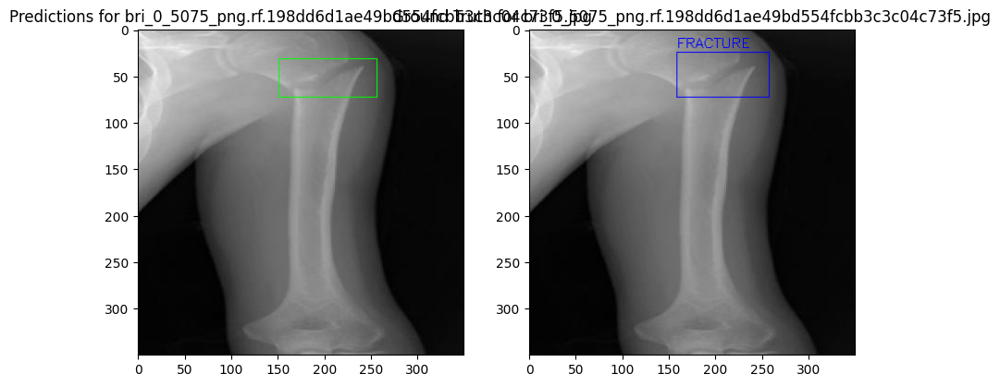

Processing test/images/bri_0_5267_png.rf.90f368f49a93fcb2f38f15b15446f252.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


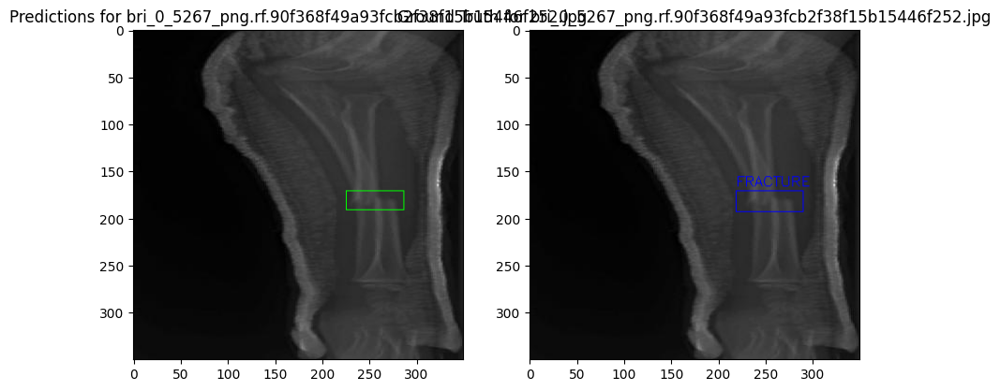

Processing test/images/bri_0_6341_png.rf.d937f6ab01c14f08579c783e7eb9c307.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


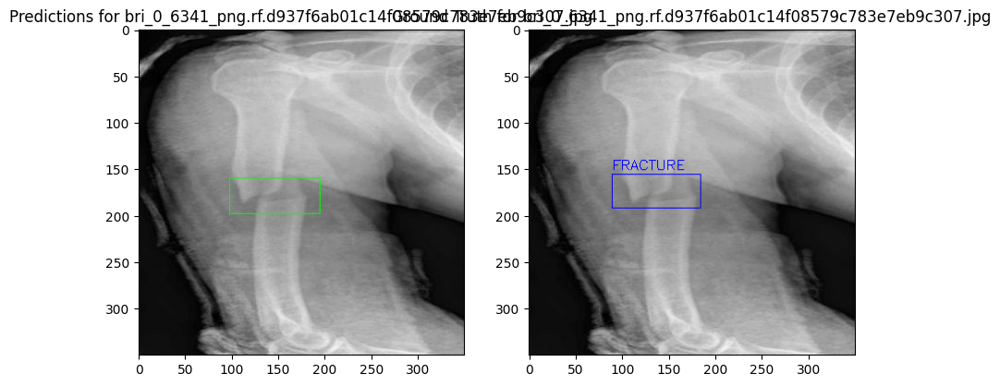

Processing test/images/bri_0_6517_png.rf.38cd60b0f57d07c424dbb54e7559c655.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


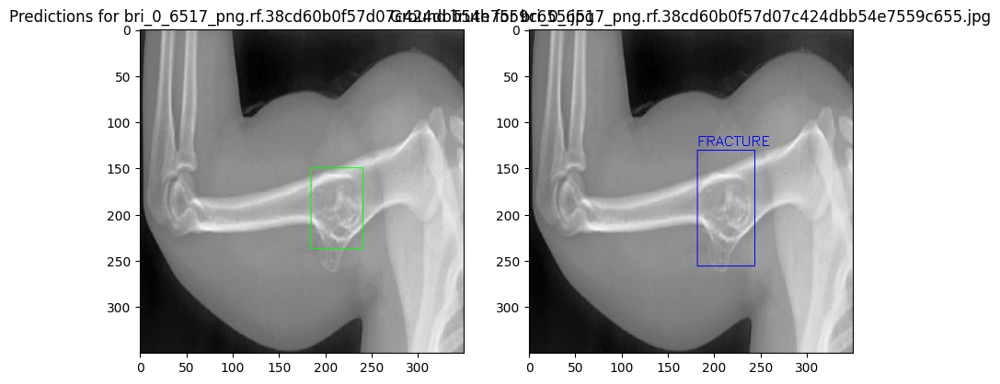

Processing test/images/bri_0_706_png.rf.4521ca54ab4235edfc8e0636cbfa969f.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


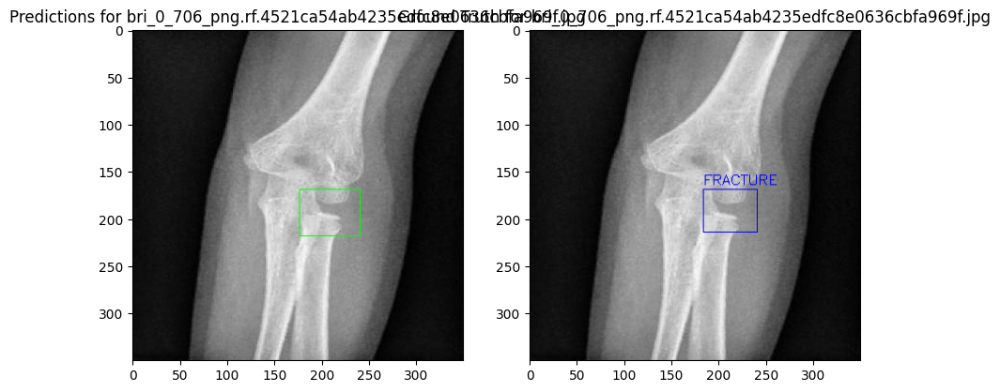

Processing test/images/bri_0_7450_png.rf.505cfdeae09285ecd4628280e75f3015.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.2ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


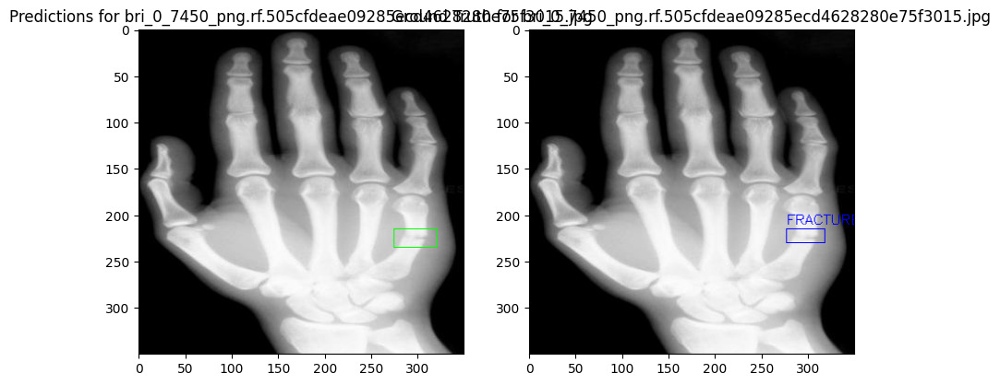

Processing test/images/bri_0_7751_png.rf.977159648e963701c16a2ca2ac6baa73.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


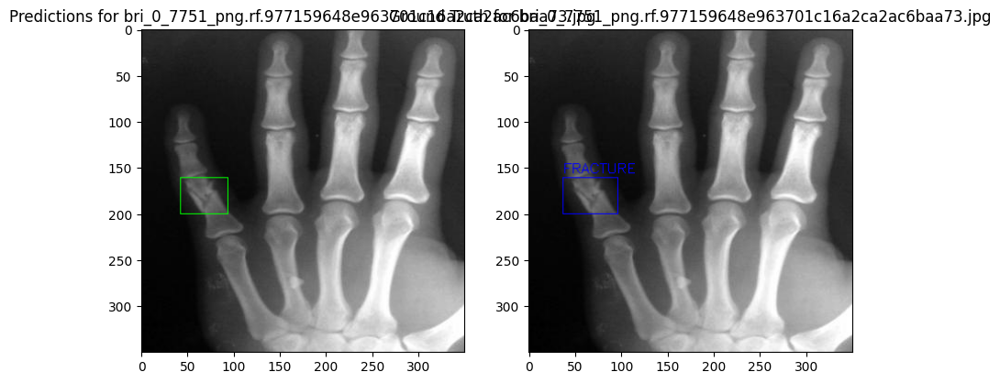

Processing test/images/bri_0_8051_png.rf.131a14548a7ee6af3a61c52b03bf33ab.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


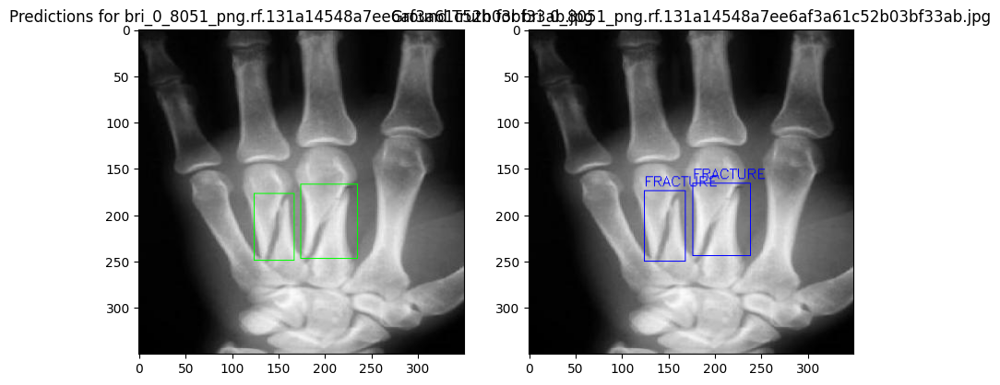

Processing test/images/bri_0_8360_png.rf.b0fa5fa36b77c5a149c873de986bc1ae.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.3ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


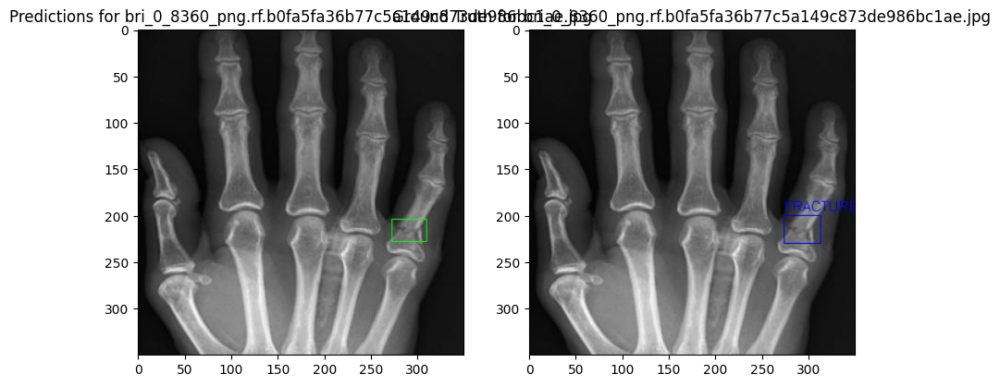

Processing test/images/bri_0_8711_png.rf.7af1aae4ccf1d4a964a35a3db399f6c2.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.3ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


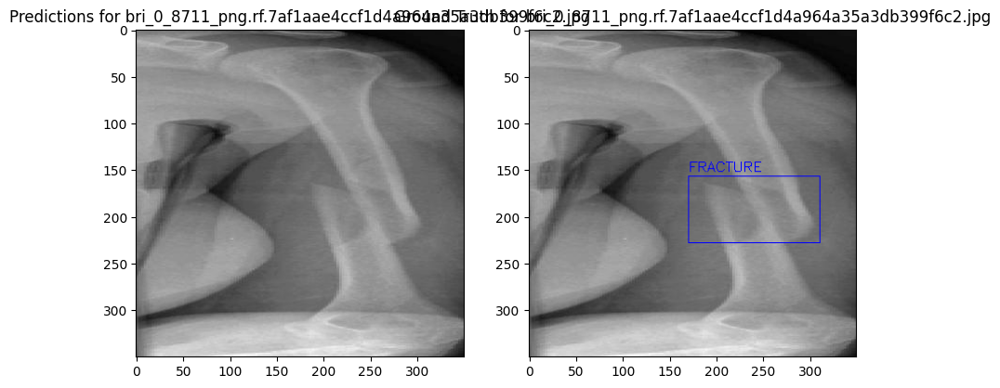

Processing test/images/bri_0_8782_png.rf.796efe9fb097b744a9c7db25f9569255.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


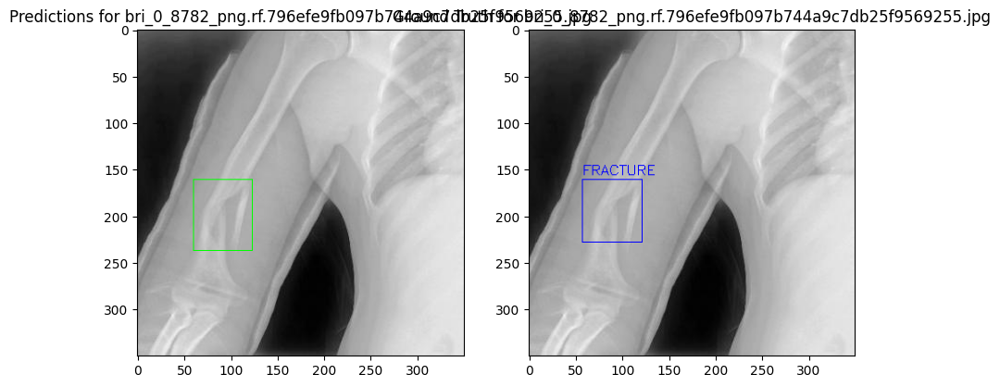

Processing test/images/bri_0_9075_png.rf.a8adeec7f6d156d89f91df074acb6e2e.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


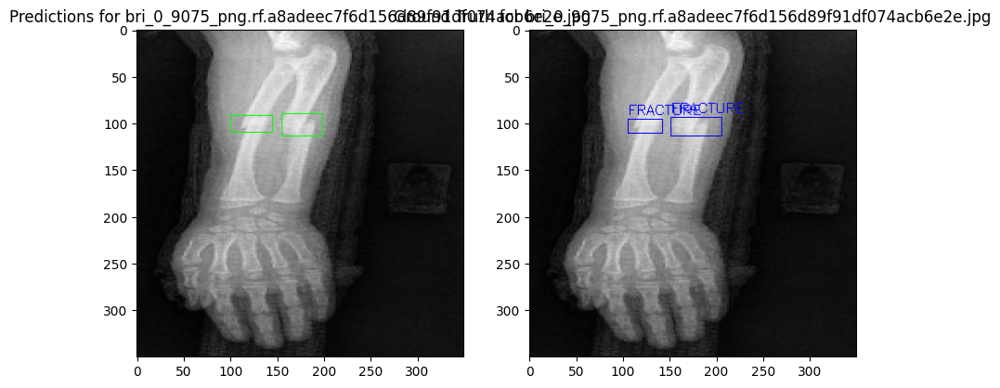

Processing test/images/bri_0_9242_png.rf.e5ba15ffa657557f478eba047638b23f.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.3ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


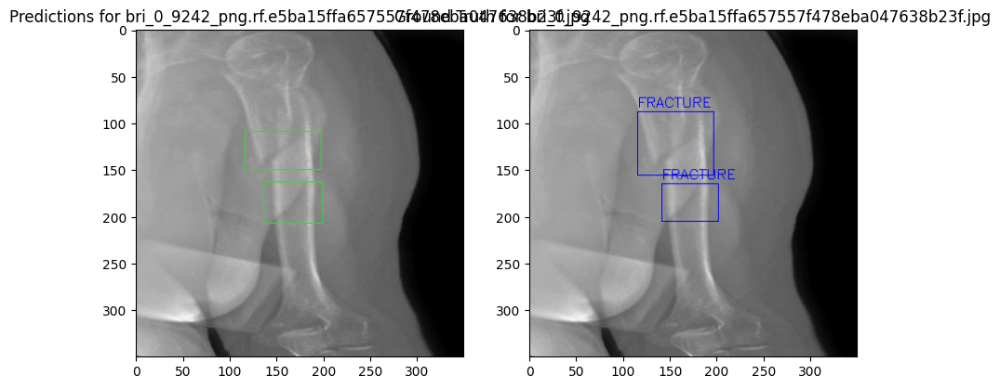

Processing test/images/bri_0_9452_png.rf.ca3259b095b4fbb385a6b1d72c8cc5b2.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


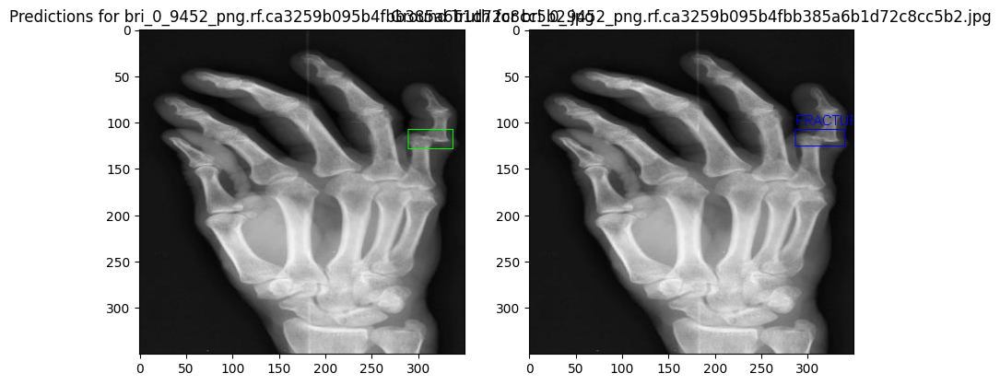

Processing test/images/bri_0_960_png.rf.affa60f8c5a46c38b401d560af087372.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


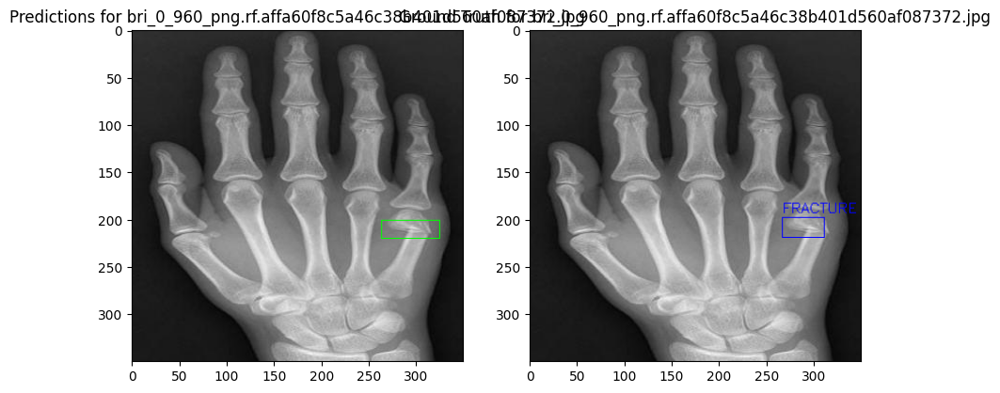

Processing test/images/bri_0_9735_png.rf.d419be1e950febf426bcdc8b7bf2c415.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


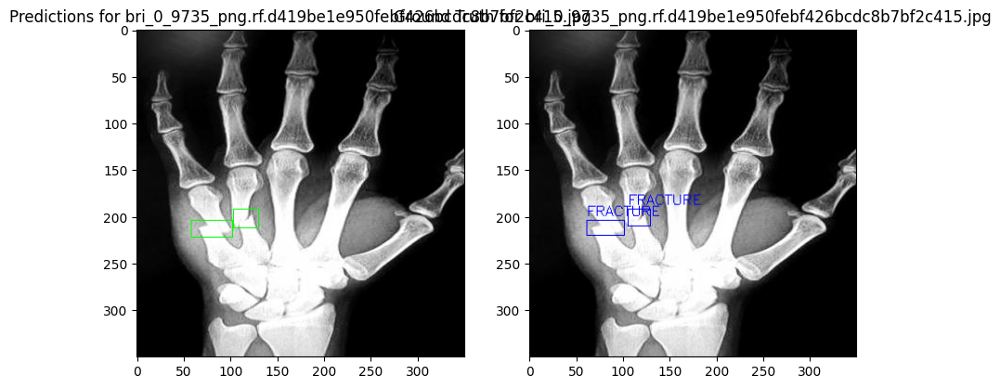

Processing test/images/bri_0_9932_png.rf.efdc4d6b9a932f0de459b718e802dc6f.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


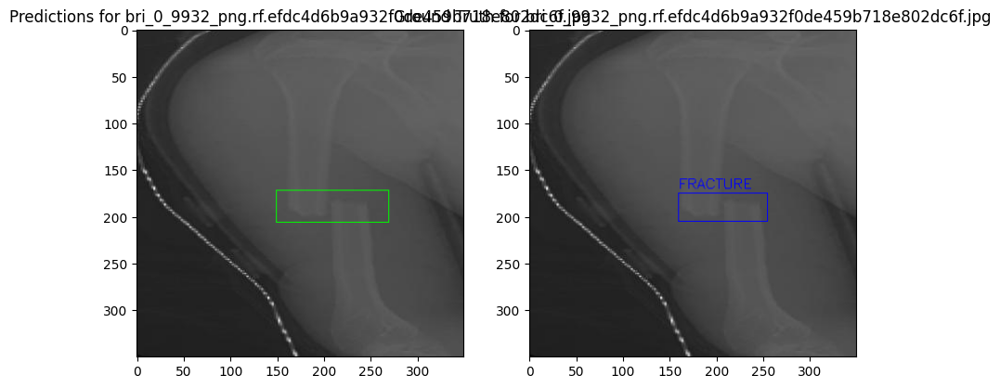

Processing test/images/flip_0_1673_png.rf.a00f2551e8fc14b7556e1566c14b2517.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


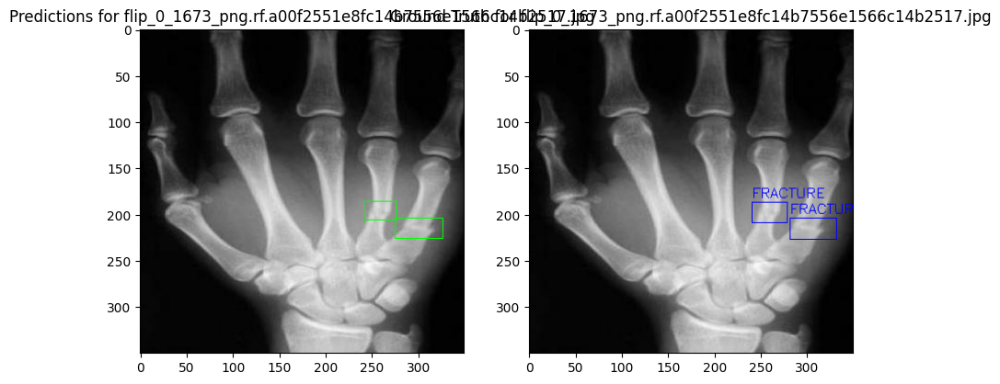

Processing test/images/flip_0_1690_png.rf.84a5642c89fed88437eb3514558d85ee.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


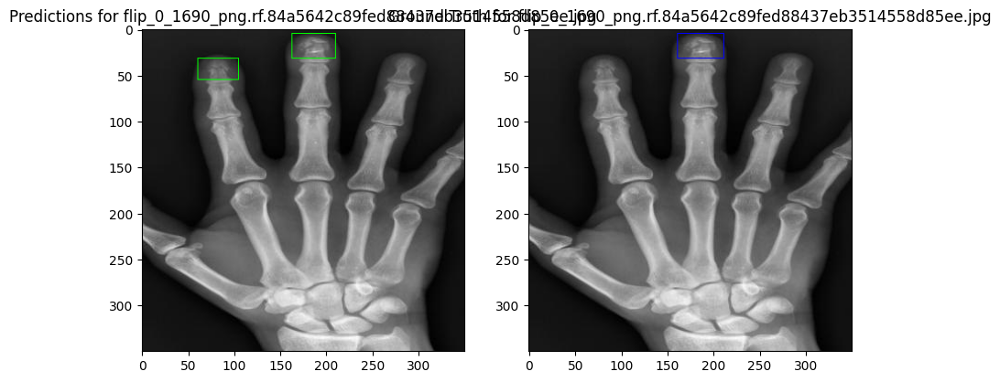

Processing test/images/flip_0_1784_png.rf.73a25f545ff2ea90bdcc04b6792a98f9.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


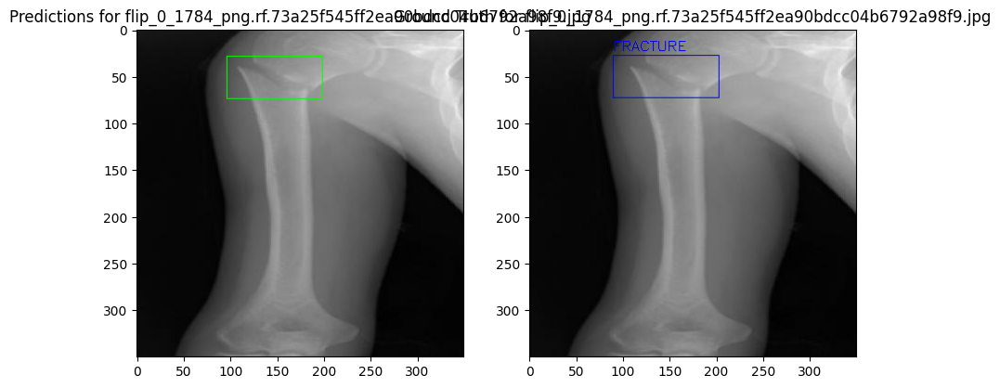

Processing test/images/flip_0_2620_png.rf.51de53a1235702e13f9e179d2c1b7699.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.2ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


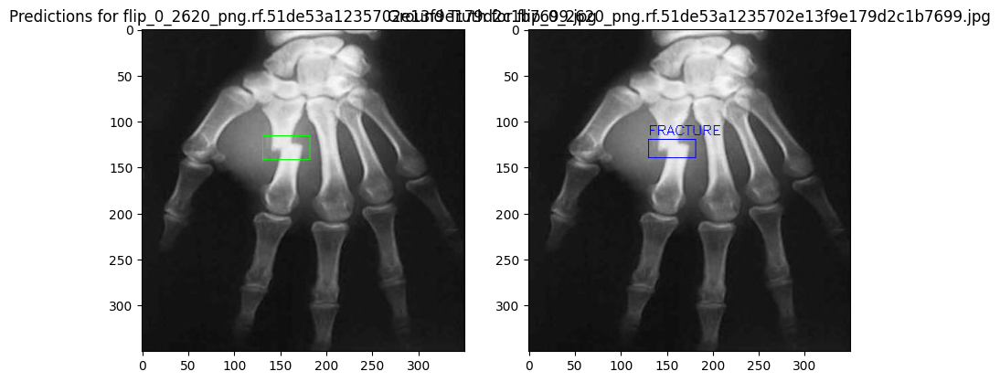

Processing test/images/flip_0_3249_png.rf.8be5acee1a9ff1d77a0b215341c38666.jpg...

0: 352x352 3 Fractures, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


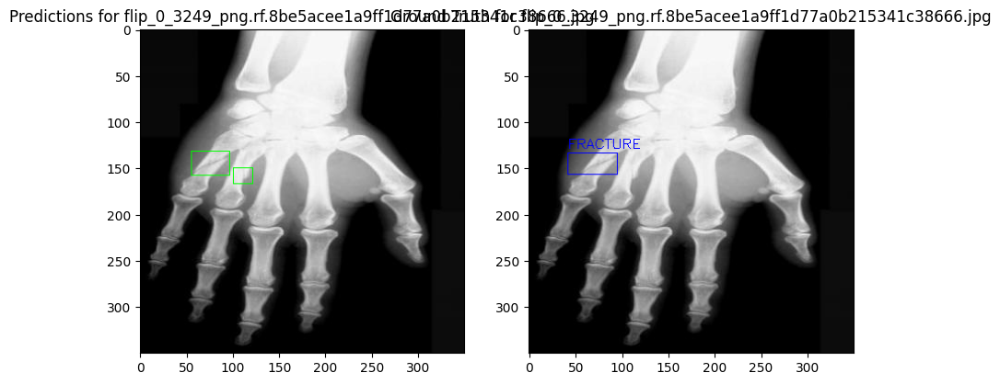

Processing test/images/flip_0_3370_png.rf.a3c2ab488c3b467699b526743d346d12.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


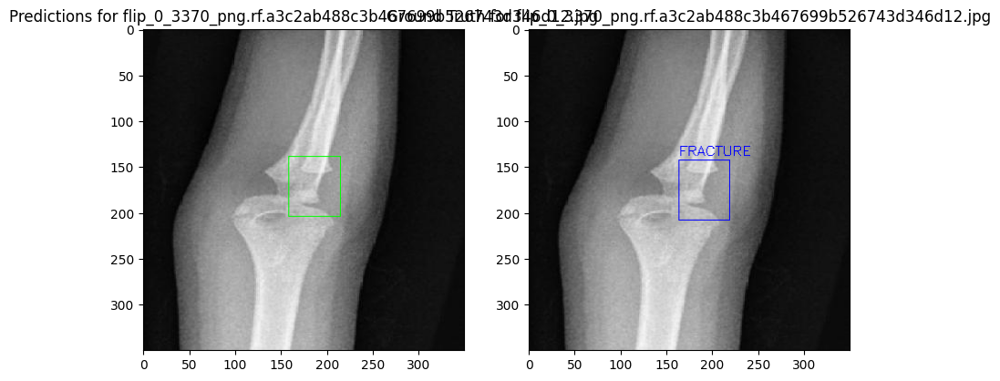

Processing test/images/flip_0_3647_png.rf.d07d5d49b19d01f54203529b0c1277af.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


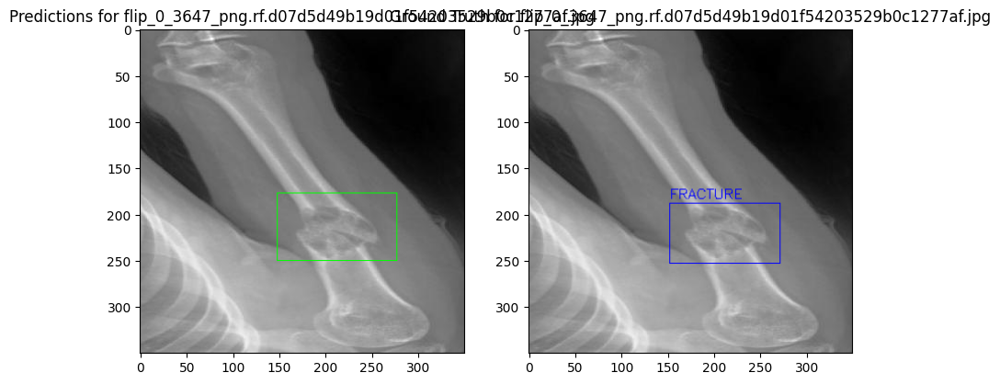

Processing test/images/flip_0_3886_png.rf.2a643ad948108784545b00282a259cda.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


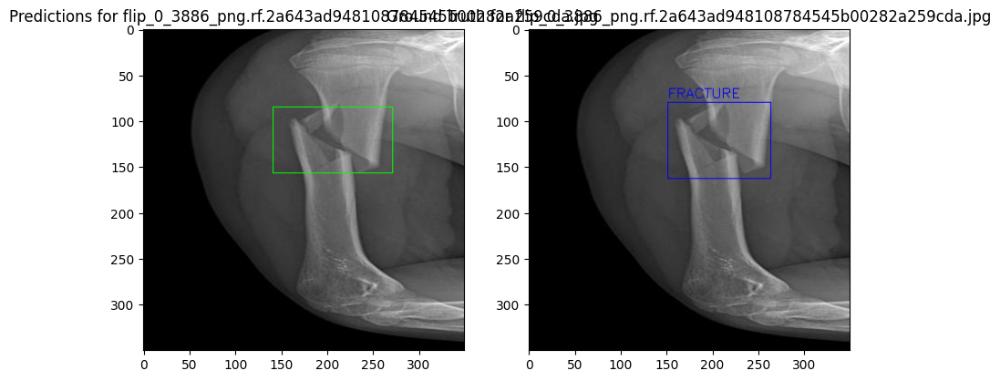

Processing test/images/flip_0_3936_png.rf.8685a1e7c2e5622a810c3b2679bfbd7e.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


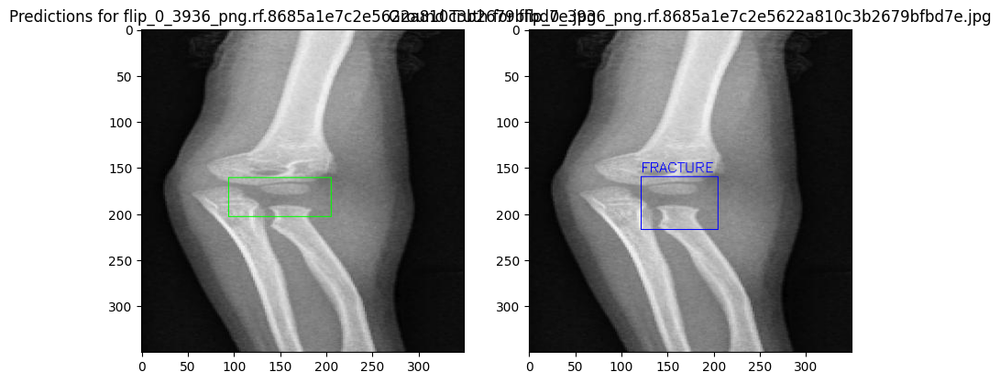

Processing test/images/flip_0_444_png.rf.b0229e5a8f2ff8ca36547fc2936b8824.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


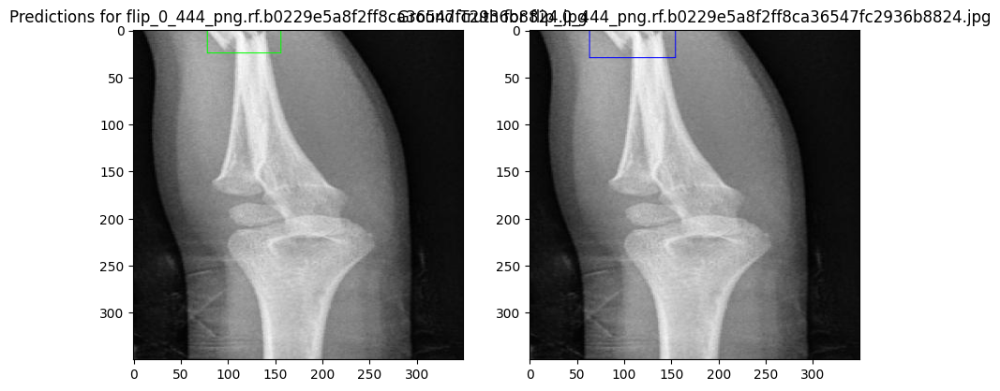

Processing test/images/flip_0_5139_png.rf.aefdefb617459cca5e96bbb706193c56.jpg...

0: 352x352 (no detections), 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 0.4ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


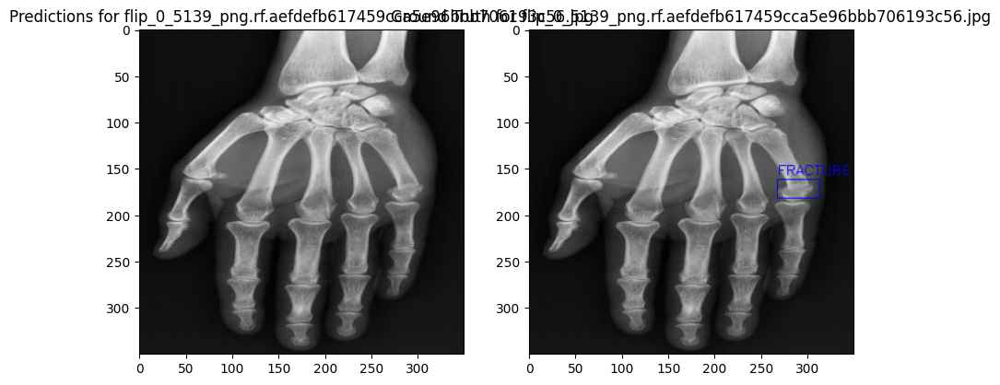

Processing test/images/flip_0_5334_png.rf.5120bceb41ab53b913ee83c303163cae.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.3ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


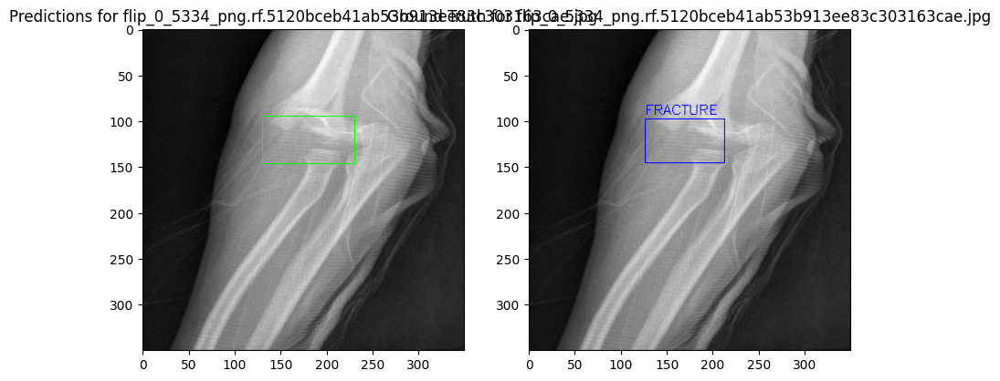

Processing test/images/flip_0_6047_png.rf.980802f21a31f39f1f773e2dc536becf.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


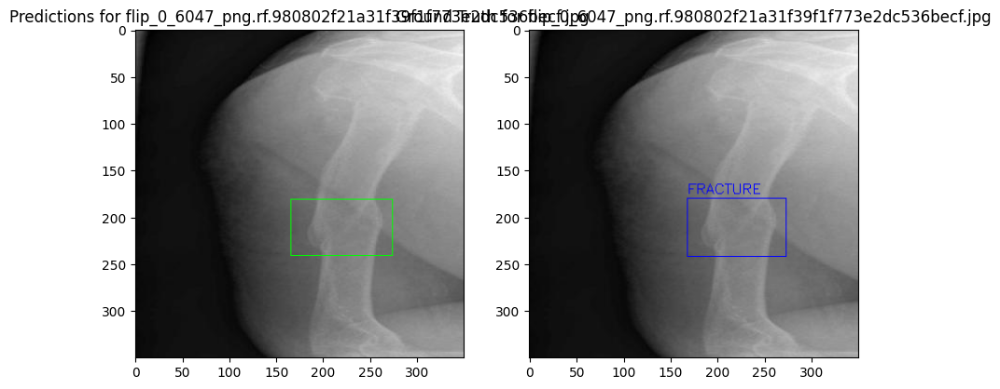

Processing test/images/flip_0_6100_png.rf.150eec6fcf23efd6a8ac88a61b66d02b.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


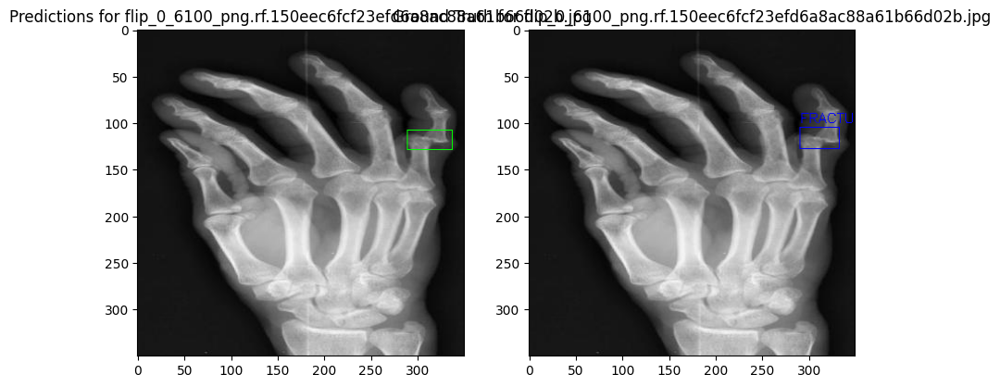

Processing test/images/flip_0_7109_png.rf.44f52ca778e1f3392f88fb9b6cdeb385.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


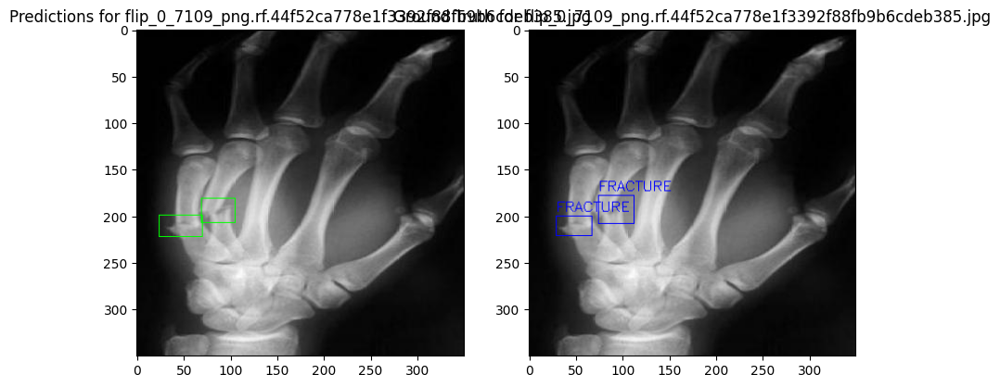

Processing test/images/flip_0_7280_png.rf.6054e3f8488dbd47be311c09e1dbbb49.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


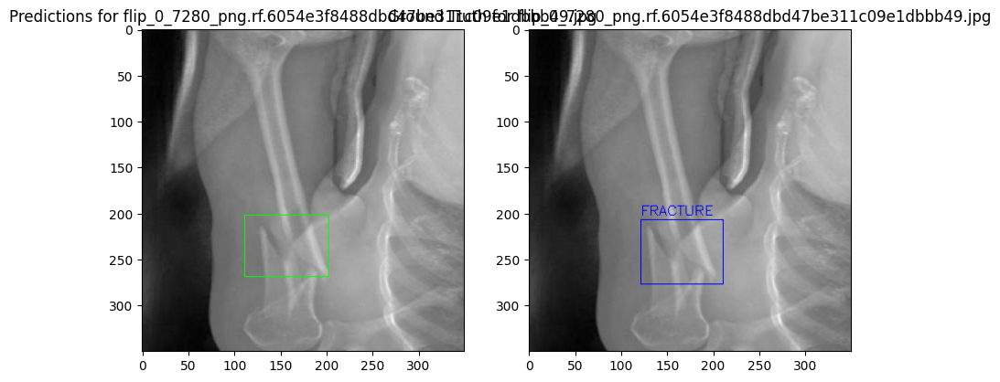

Processing test/images/flip_0_7490_png.rf.039f1473c7659974925a6f44b4ebf790.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


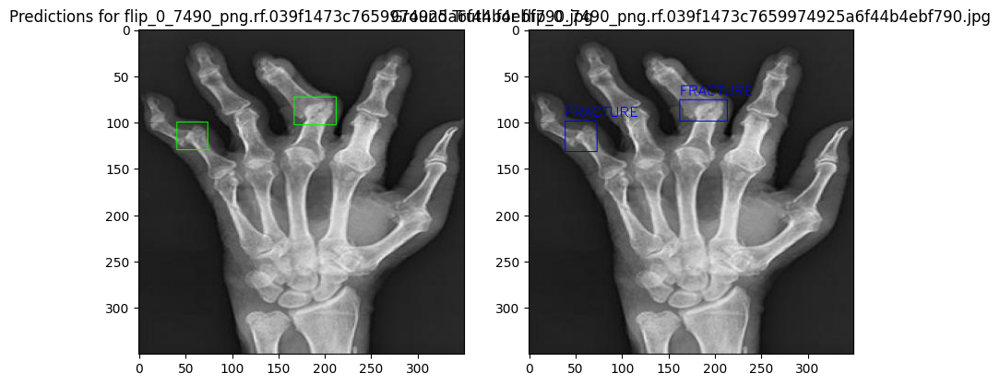

Processing test/images/flip_0_8508_png.rf.a7d25db1ad0b5d10692a747dbc6709ed.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.3ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


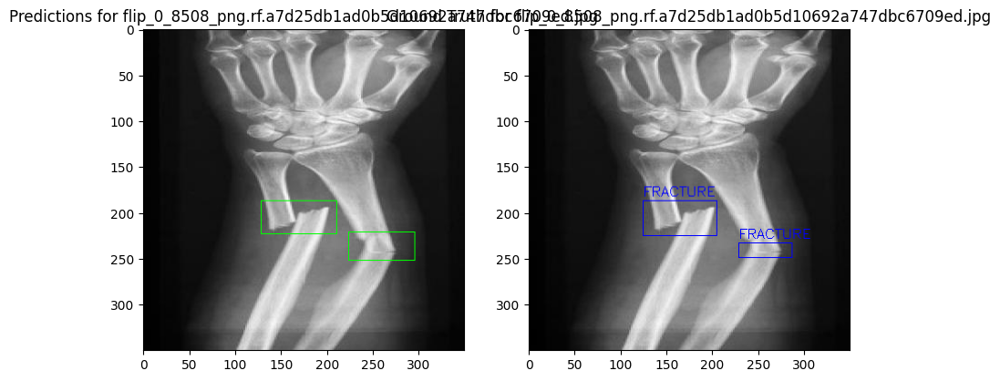

Processing test/images/flip_0_8582_png.rf.e46745df541709d6e9d0340f051cc191.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


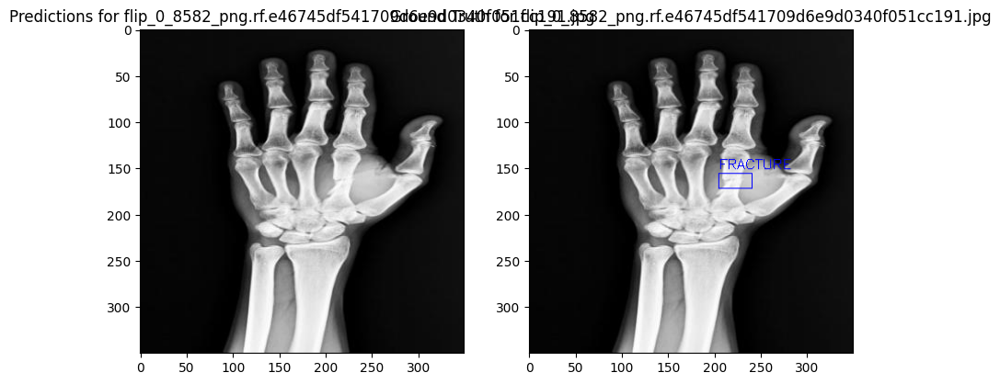

Processing test/images/flip_0_9167_png.rf.fe26f5dc6595f32882bd40191aff46b4.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


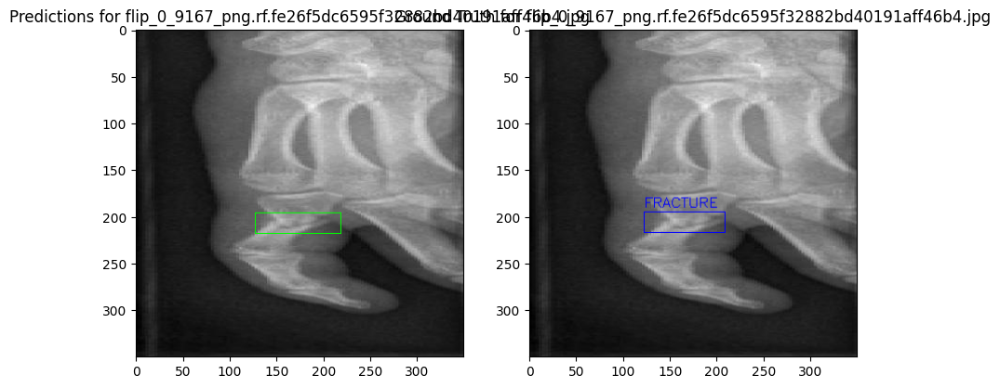

Processing test/images/flip_0_9531_png.rf.19433f974814788d8424ee53f1162587.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.4ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


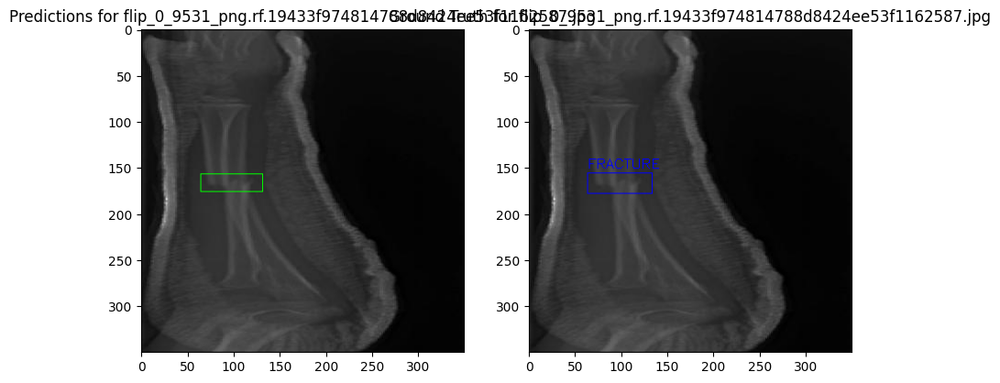

Processing test/images/flip_0_955_png.rf.3a073e86d141301b5c15bdd16e859914.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.3ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


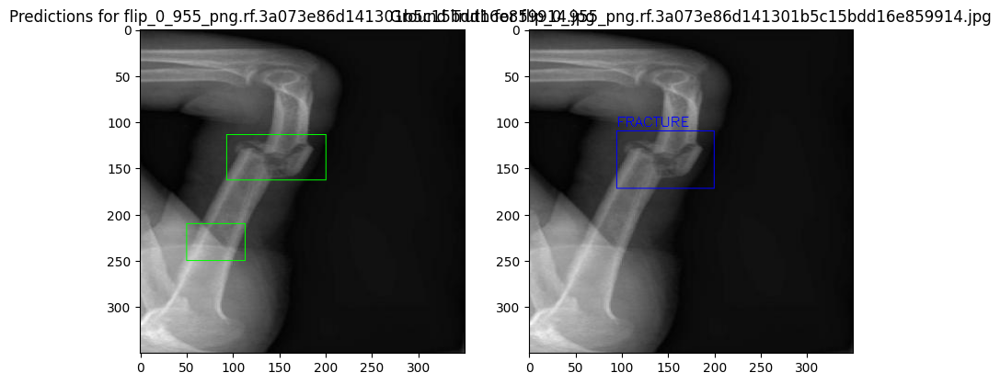

Processing test/images/flip_0_9831_png.rf.ea2bc536da3844aa0d4b128d19961707.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


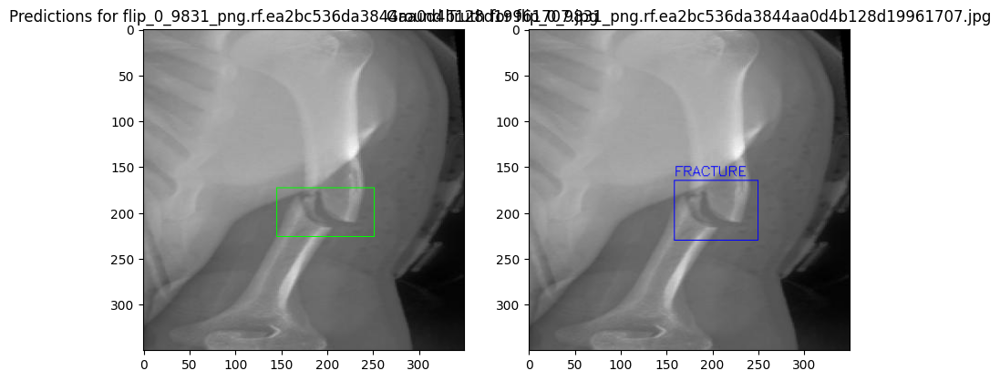

Processing test/images/n_0_1732_png.rf.047d09d98983a8f61c9fef3c9afb98e5.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


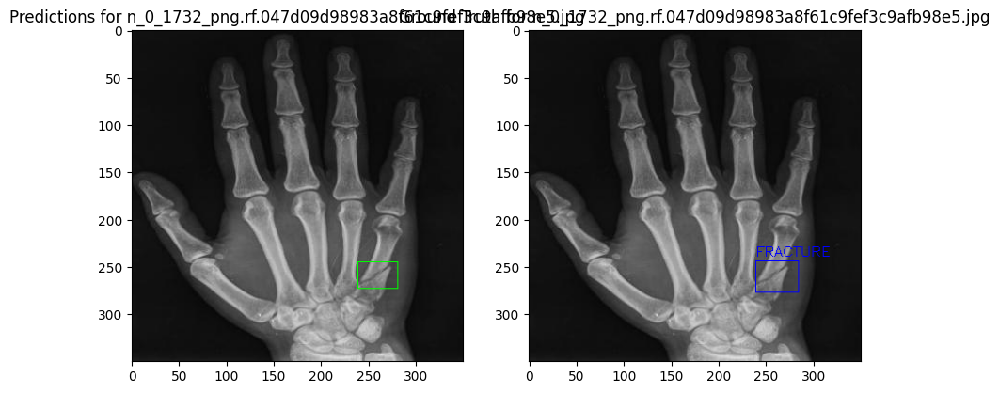

Processing test/images/n_0_1959_png.rf.b38769a9079c75bd02734dab0b896f7d.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


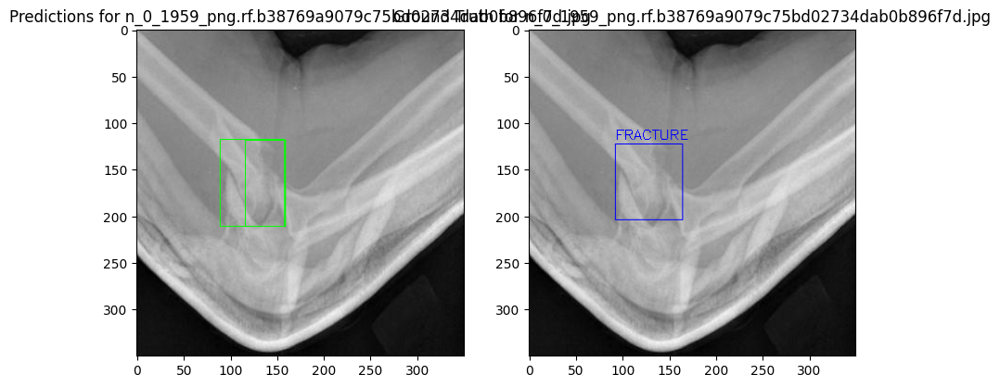

Processing test/images/n_0_2483_png.rf.c7033d1072a5a538ffe528b0d2c19c04.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


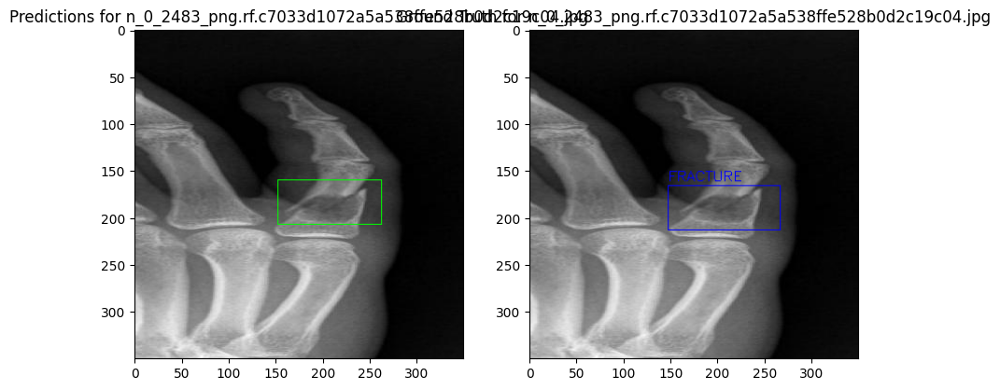

Processing test/images/n_0_2976_png.rf.0ab7c579f41516f2350586c7602da2b3.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.3ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


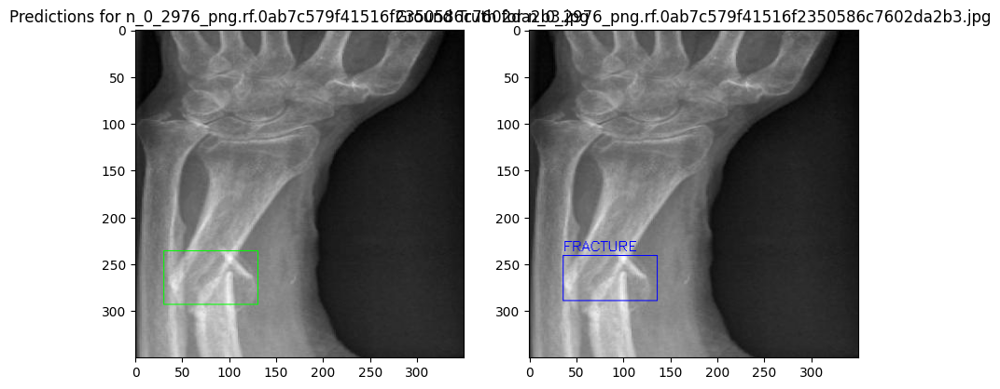

Processing test/images/n_0_3343_png.rf.e9a0f9b4ab14bb936389e6b953f5b3a9.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.5ms preprocess, 12.9ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


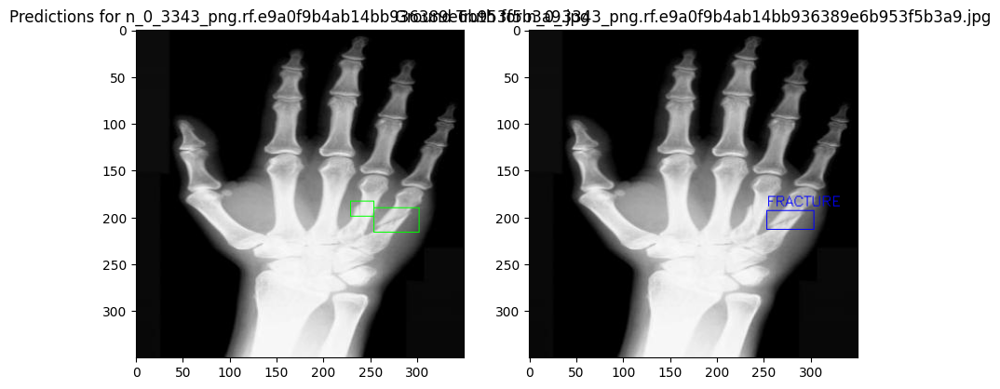

Processing test/images/n_0_3357_png.rf.c4582e0680ed7acd666a93faffea03b1.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


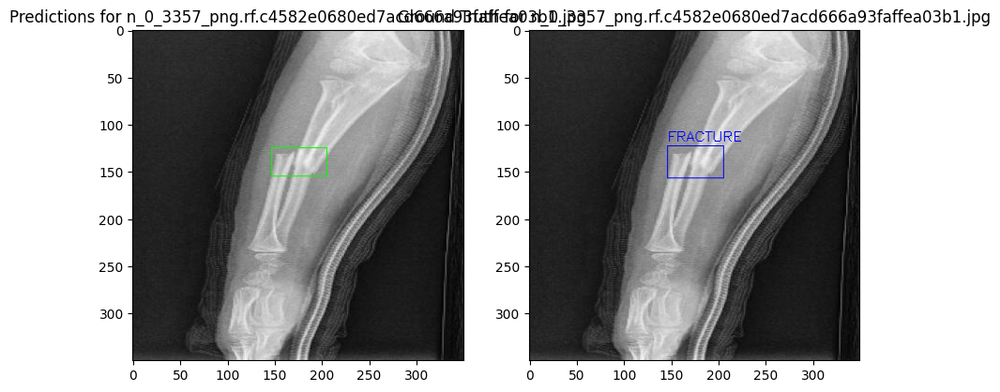

Processing test/images/n_0_342_png.rf.a6a7416c868e7c83ffc6c259d5125602.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.2ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


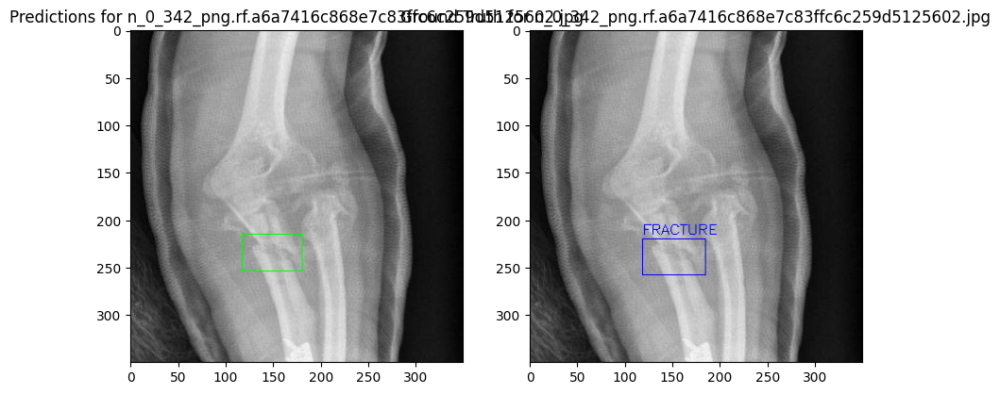

Processing test/images/n_0_4065_png.rf.0935e27bd8193a4bf6ddd3f35ed4fa92.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.3ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


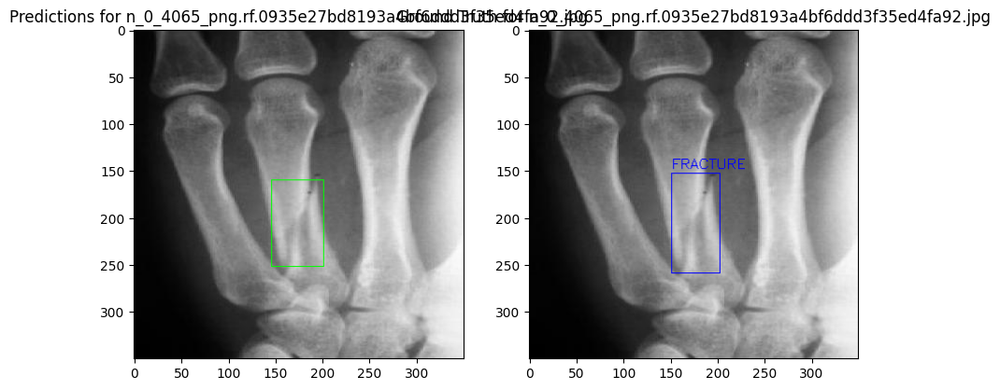

Processing test/images/n_0_5565_png.rf.cdcd20c21b5ca67a41cda4971eaef50b.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


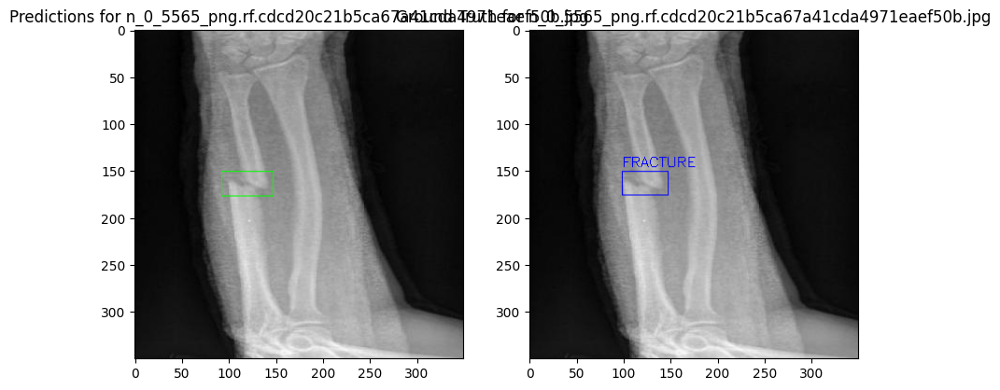

Processing test/images/n_0_6020_png.rf.a667d17d4a56abba858fdd9b6b947252.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


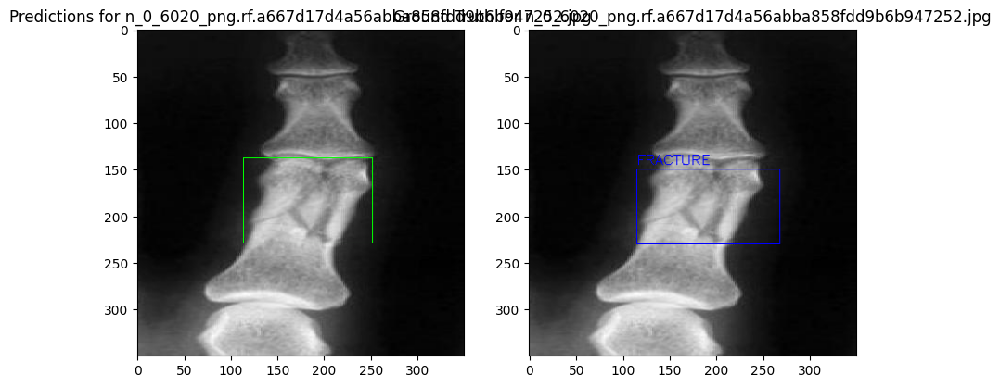

Processing test/images/n_0_61_png.rf.d0f3e2aa2d69599e5fda9d87d3ca7ce8.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


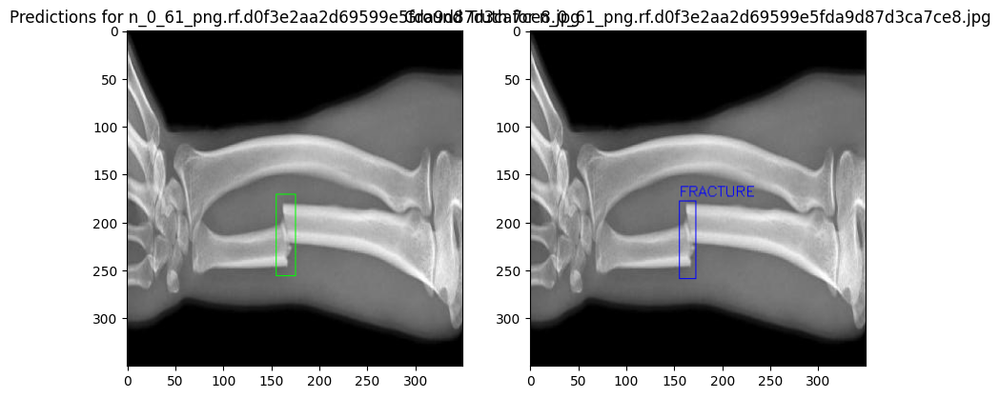

Processing test/images/n_0_6320_png.rf.8a48f2b7e90579208ff1aec06faf0542.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


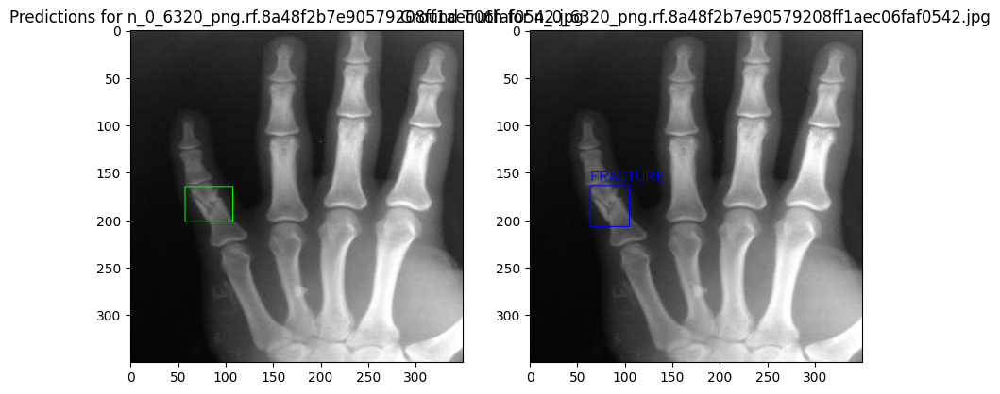

Processing test/images/n_0_6506_png.rf.e8a8582199c24d85d9790845166e920b.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


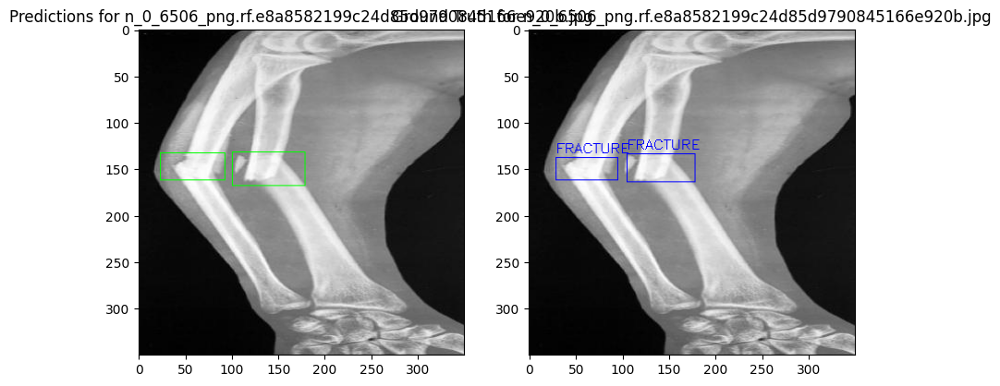

Processing test/images/n_0_7750_png.rf.a8a78b4b7a04195d726cfae51a821589.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


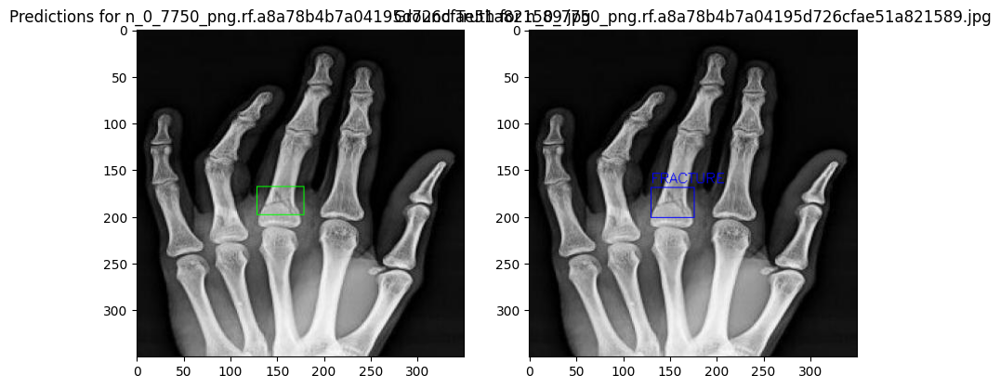

Processing test/images/n_0_7922_png.rf.cea7766f4a8b4cea2b73fc7925993487.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


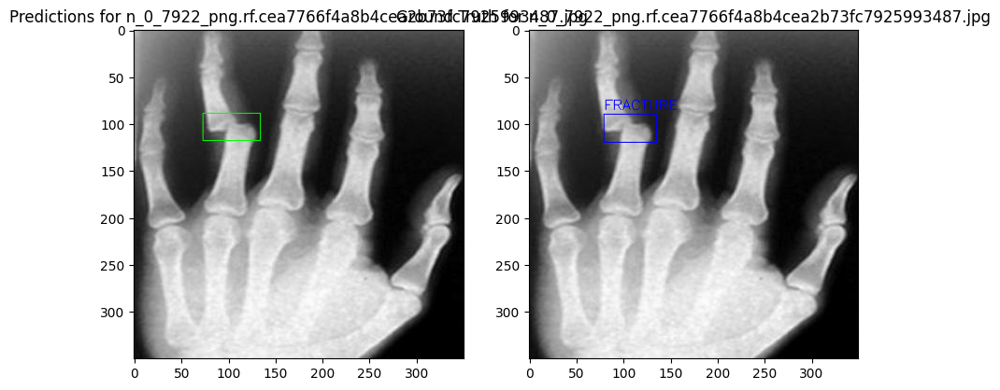

Processing test/images/n_0_873_png.rf.6314d6ac97336161d09124060d74bdb4.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 0.9ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


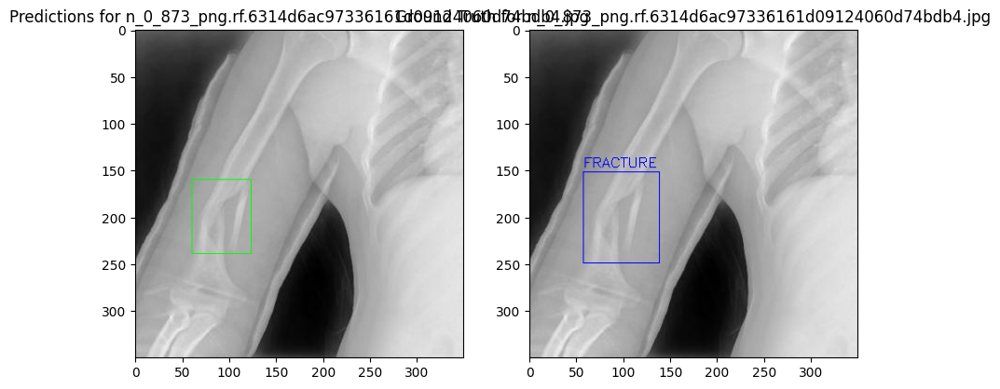

Processing test/images/n_0_9389_png.rf.19b94502cd6cea3b623e420fabd99954.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


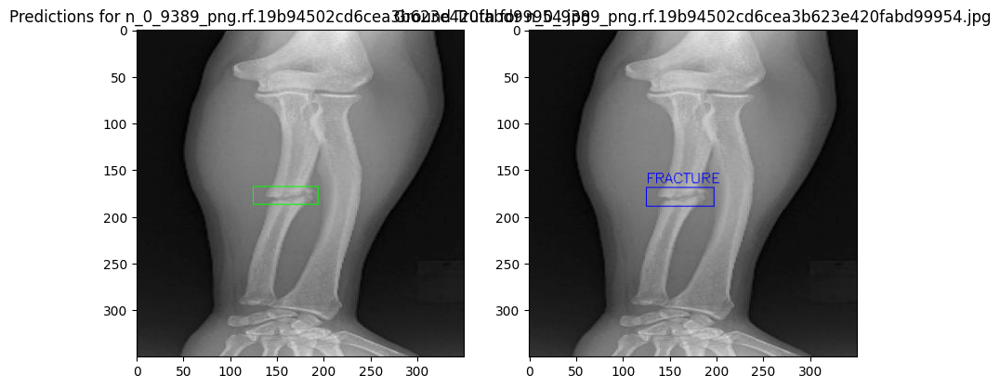

Processing test/images/n_0_9771_png.rf.184d9a8f77063c5d0b49bf5a4f2f04bd.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


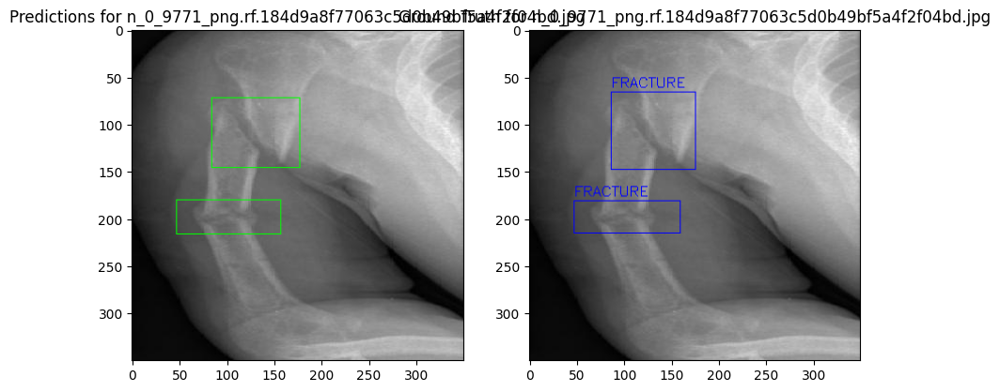

Processing test/images/n_0_9792_png.rf.d15f9d088efcf60fbd3a2a7e9ca9d1c8.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


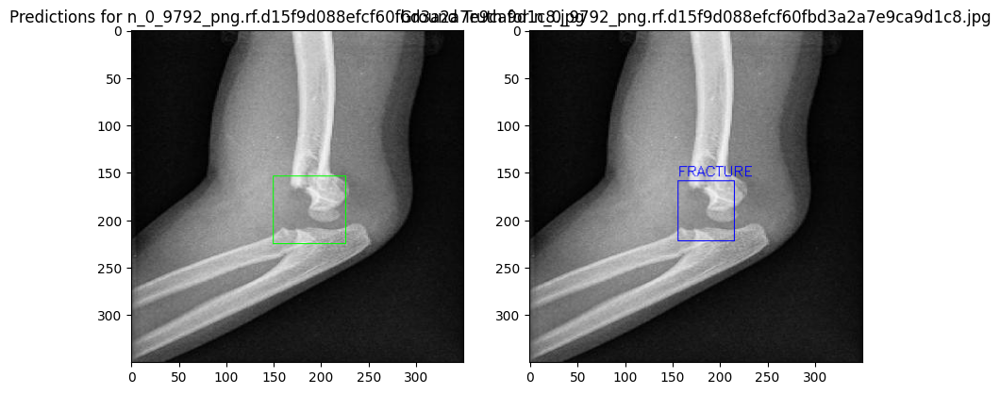

Processing test/images/rot_0_126_png.rf.047e74da42249605357cdbe0028f9dd8.jpg...

0: 352x352 3 Fractures, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


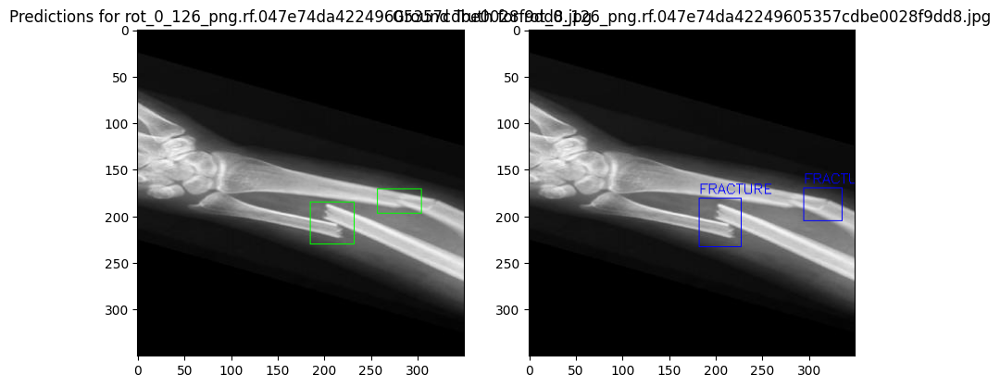

Processing test/images/rot_0_3291_png.rf.21391ac0255fafb85ef2ea25feefd5da.jpg...

0: 352x352 (no detections), 12.8ms
Speed: 1.1ms preprocess, 12.8ms inference, 0.4ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


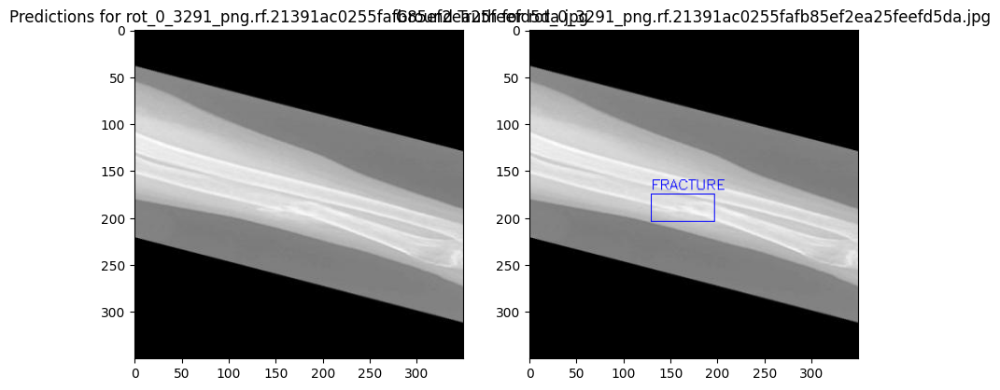

Processing test/images/rot_0_6348_png.rf.463ed98e14194c85b31000c9e7d3a612.jpg...

0: 352x352 (no detections), 12.8ms
Speed: 1.2ms preprocess, 12.8ms inference, 0.4ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


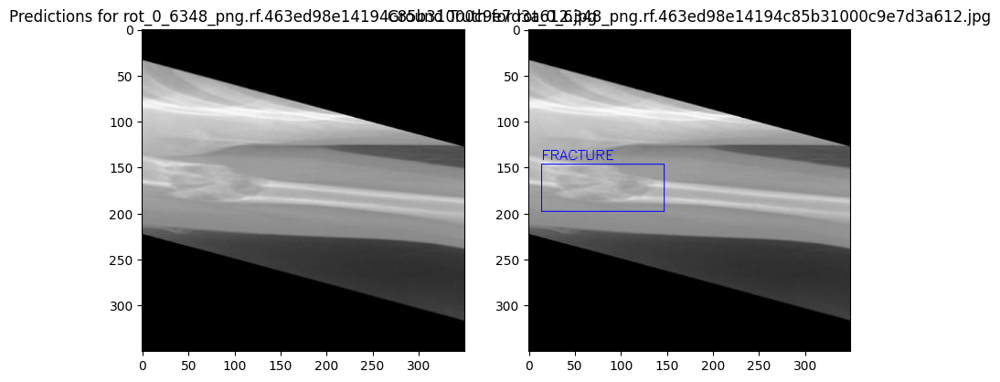

Processing test/images/rot_0_6612_png.rf.9c4b183e61088d7cc8701c54ac657ff1.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


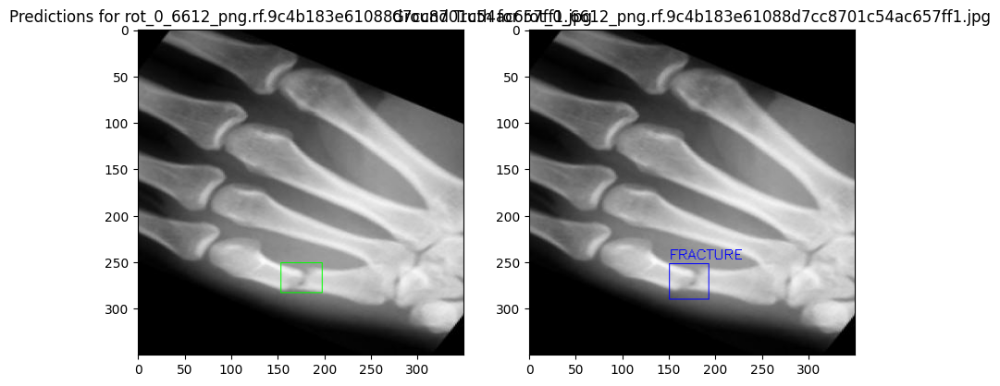

Processing test/images/rot_0_9070_png.rf.c4af39aa051a8180eaf4085ad5c4543b.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.2ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


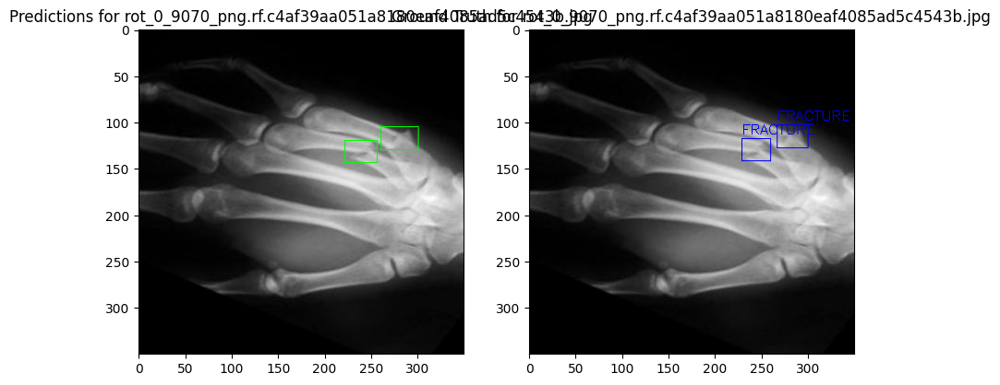

Processing test/images/rot_0_9919_png.rf.9a12651c5fc19d410eb495595c88fd9b.jpg...

0: 352x352 (no detections), 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


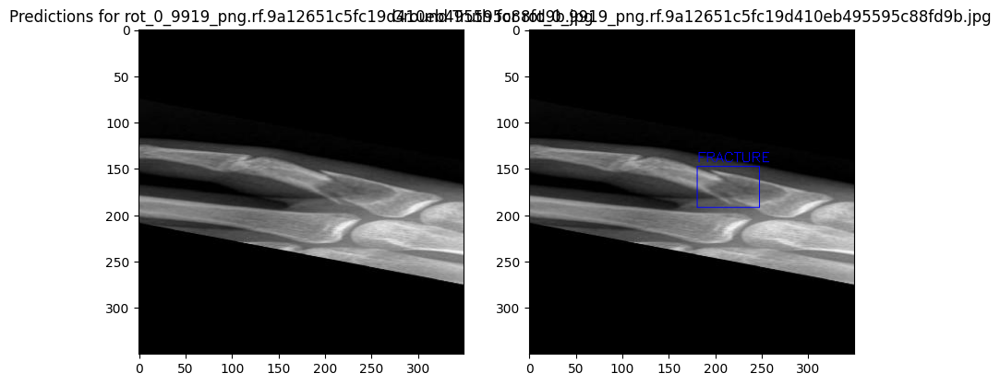

Processing test/images/z_0_1611_png.rf.21b70ecbc92c8cef28af8d7c1b68edc9.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


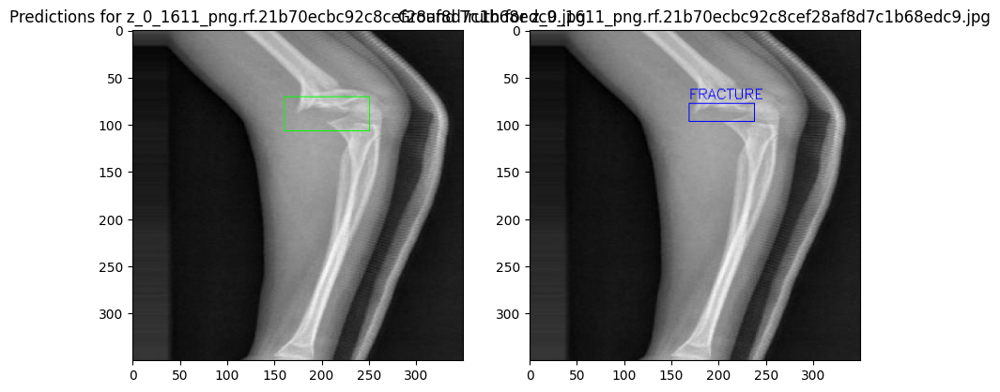

Processing test/images/z_0_206_png.rf.2d08385a45054aee7124a5e5937e88df.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


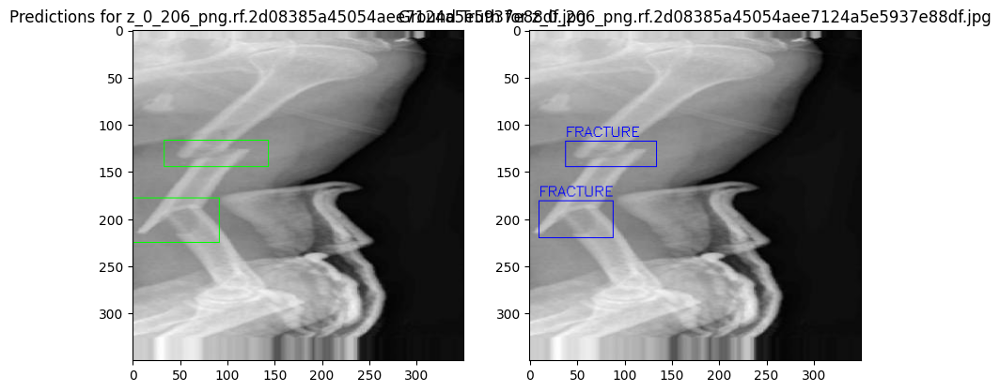

Processing test/images/z_0_2908_png.rf.4c36119e6c5f99793b5a6dcbbb52e830.jpg...

0: 352x352 2 Fractures, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


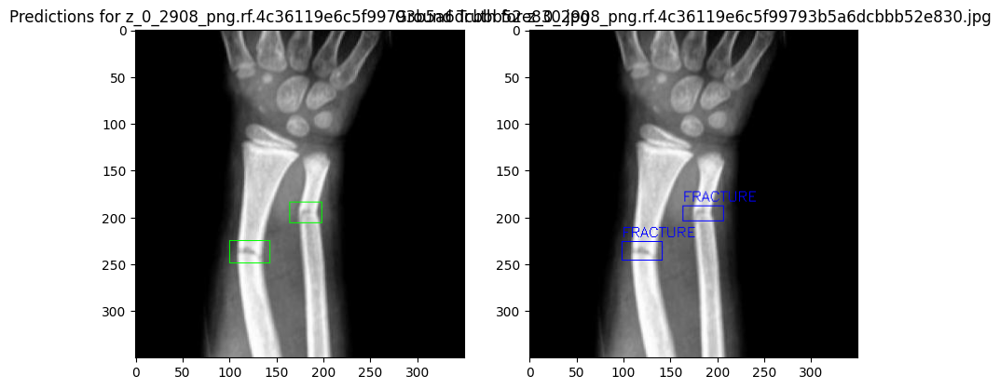

Processing test/images/z_0_2910_png.rf.2e6fad2ed3572c0192aa6410bbe5bc61.jpg...

0: 352x352 4 Fractures, 12.9ms
Speed: 1.3ms preprocess, 12.9ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


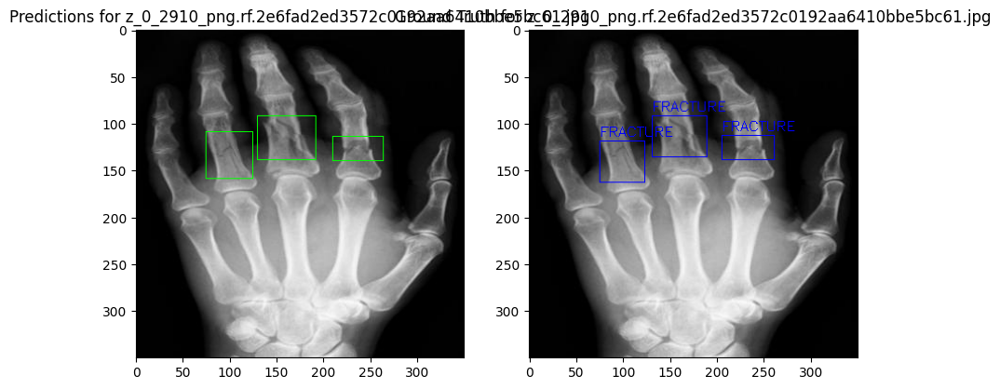

Processing test/images/z_0_2998_png.rf.c9906922f79fd8c8fcba42e852889bd5.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


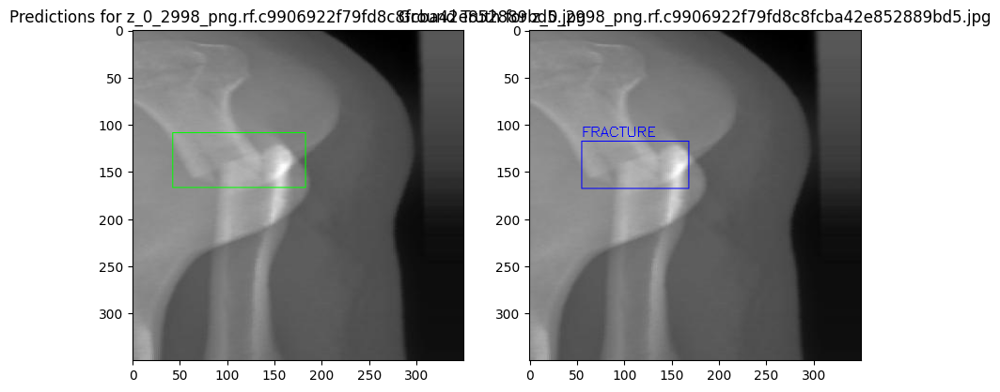

Processing test/images/z_0_3620_png.rf.f26a3f9c6b66df92bd68ef3f79167007.jpg...

0: 352x352 4 Fractures, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


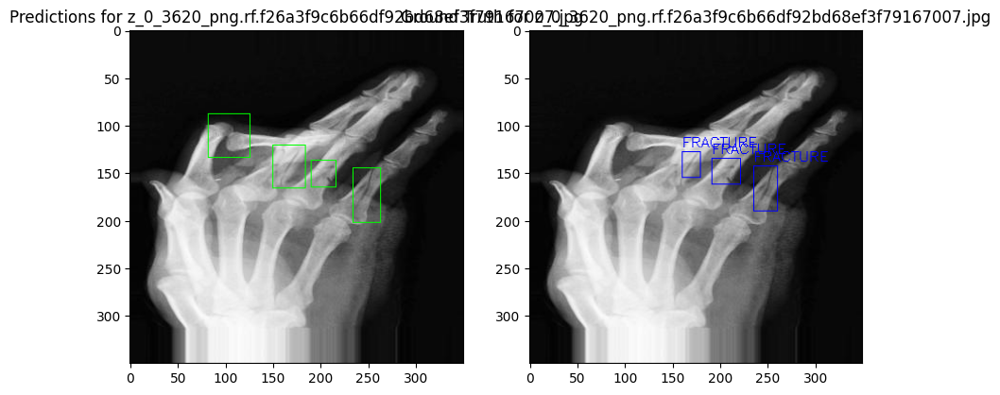

Processing test/images/z_0_581_png.rf.b10cfc74bfe7d0d5c69918eb8bf3ae6e.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.5ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


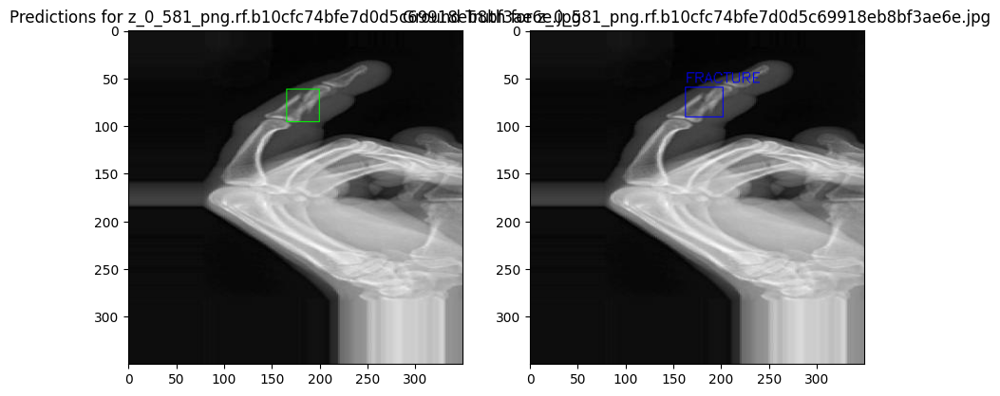

Processing test/images/z_0_6413_png.rf.d397b6e3ecc7ba6cbf7025214ba1e382.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


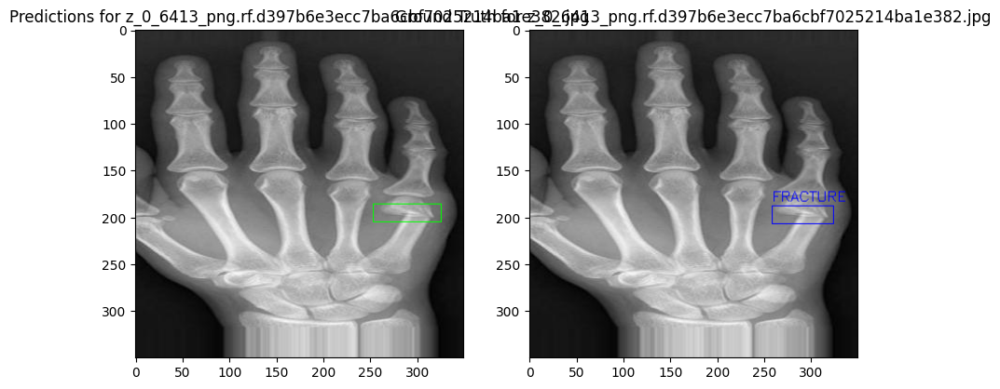

Processing test/images/z_0_6746_png.rf.7d5af80d79b247206124b853a1a4f891.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


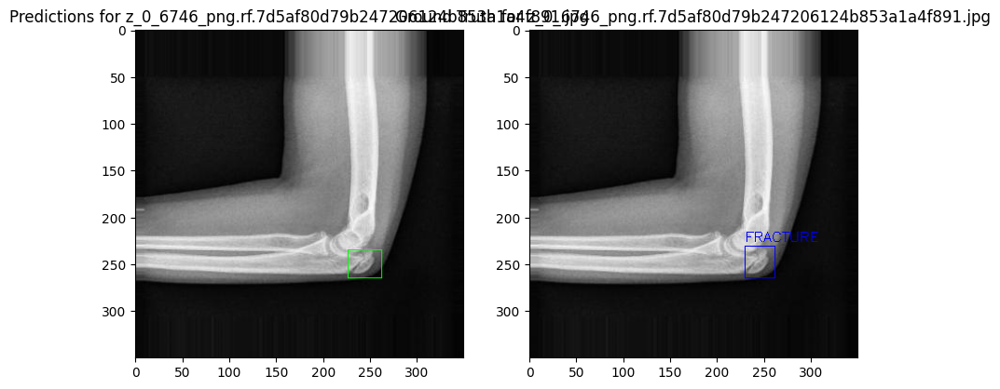

Processing test/images/z_0_6857_png.rf.83133c29c121450c39f4a678333d7372.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 0.9ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


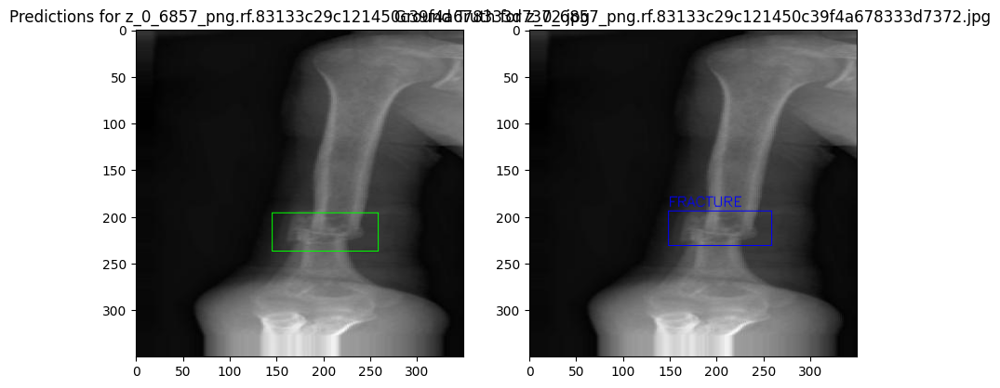

Processing test/images/z_0_715_png.rf.874e9141963fc49296b1c02520c3edf5.jpg...

0: 352x352 2 Fractures, 12.9ms
Speed: 1.2ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


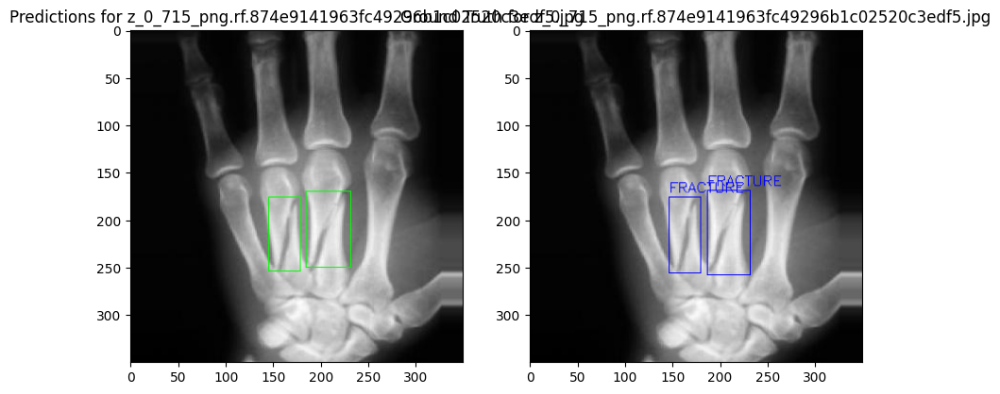

Processing test/images/z_0_8012_png.rf.238dc09d68a63d06c49ffd18816311f1.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


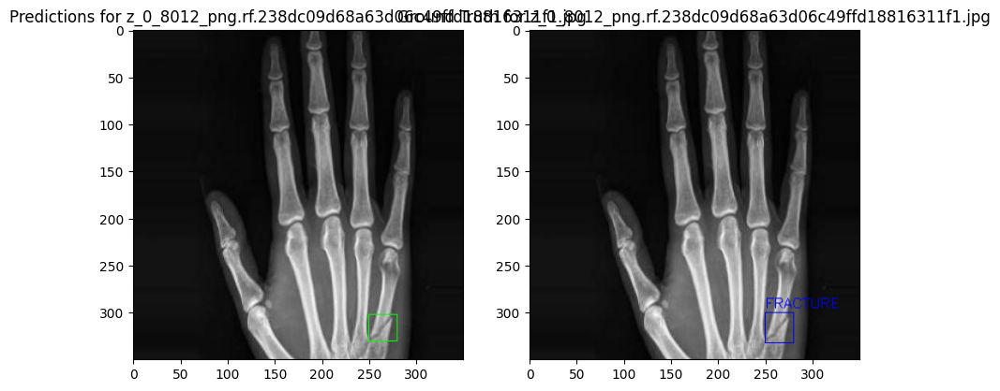

Processing test/images/z_0_8717_png.rf.47b81e190e05238aa5b2088255797ce2.jpg...

0: 352x352 1 Fracture, 12.8ms
Speed: 1.2ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


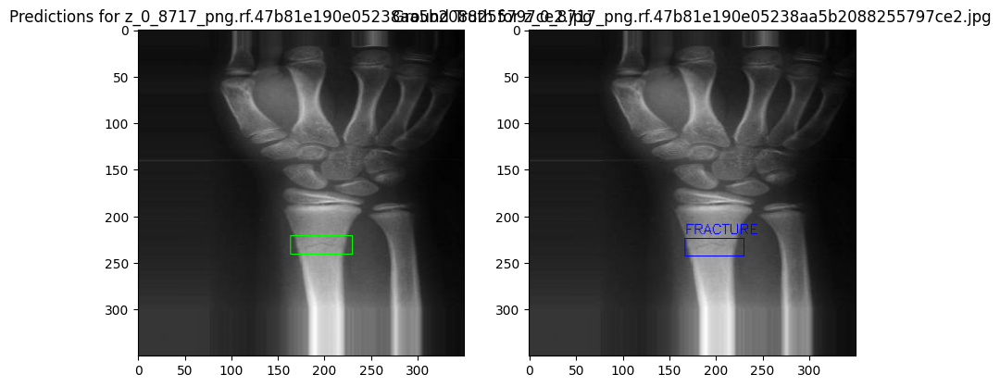

Processing test/images/z_0_8996_png.rf.3c7cedbdbb25d19855feb6f72c8e731c.jpg...

0: 352x352 3 Fractures, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


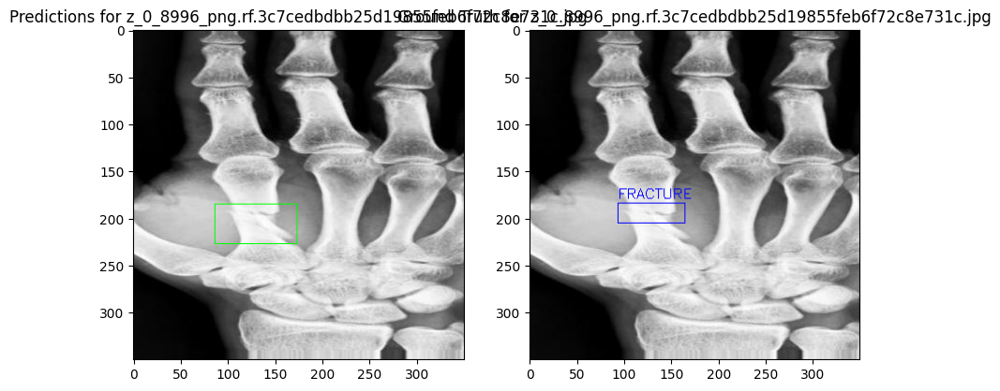

Processing test/images/z_0_9056_png.rf.71dd689b135c781980063f3464be079f.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.0ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


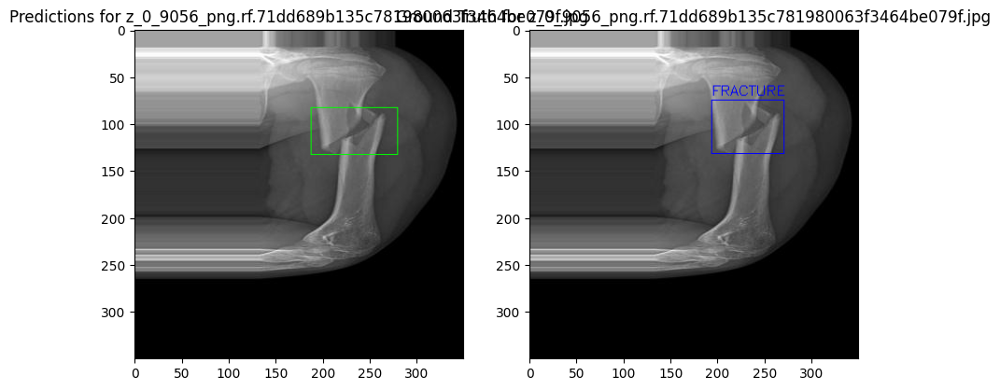

Processing test/images/z_0_9966_png.rf.abc31f5979c25e33375b871fc0d7333f.jpg...

0: 352x352 1 Fracture, 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)
Inference completed successfully.
Bounding boxes drawn on predictions.
Annotations loaded successfully.
Bounding boxes drawn for ground truth annotations.


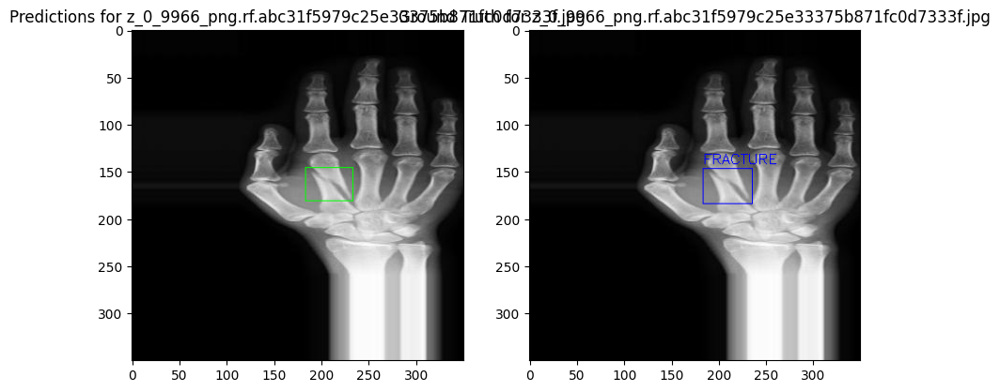

In [9]:
import cv2
import torch
from ultralytics import YOLO
import matplotlib.pyplot as plt
import glob
import os

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Load the YOLO model
model = YOLO("../Data-to-clone/runs/detect/My-Model3/weights/best.pt").to(device)

# Directory paths for images and labels
image_dir = "test/images/"
label_dir = "test/labels/"

# List all image and label file paths
image_paths = glob.glob(os.path.join(image_dir, "*.jpg"))
label_paths = [os.path.join(label_dir, os.path.basename(img_path).replace(".jpg", ".txt")) for img_path in image_paths]

# Processing threshold
threshold = 0.5

# Process each image-label pair
for img_path, label_path in zip(image_paths, label_paths):
    print(f"Processing {img_path}...")

    # Load the image
    img = cv2.imread(img_path)
    if img is None:
        print(f"Error loading image {img_path}")
        continue
    H, W, _ = img.shape

    # Copy images for predictions and ground truth
    imgPredict = img.copy()
    imgTruth = img.copy()

    # Run inference
    try:
        results = model(imgPredict)[0]
        print("Inference completed successfully.")
    except Exception as e:
        print(f"Error during model inference: {e}")
        continue

    # Draw bounding boxes from predictions
    try:
        for result in results.boxes.data.tolist():
            x1, y1, x2, y2, score, class_id = result
            if score > threshold:
                cv2.rectangle(imgPredict, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 1)
        print("Bounding boxes drawn on predictions.")
    except Exception as e:
        print(f"Error drawing bounding boxes: {e}")
        continue

    # Load annotations
    annotations = []
    try:
        with open(label_path, 'r') as f:
            lines = f.readlines()
        for line in lines:
            values = line.split()
            label = values[0]
            x, y, w, h = map(float, values[1:])
            annotations.append((label, x, y, w, h))
        print("Annotations loaded successfully.")
    except FileNotFoundError:
        print(f"Label file '{label_path}' does not exist.")
    except Exception as e:
        print(f"Error loading or processing annotations: {e}")
        continue

    # Draw ground truth bounding boxes
    try:
        for annotation in annotations:
            label, x, y, w, h = annotation
            class_name = model.names[int(label)].upper() if int(label) < len(model.names) else "UNKNOWN"

            x1 = int((x - w / 2) * W)
            y1 = int((y - h / 2) * H)
            x2 = int((x + w / 2) * W)
            y2 = int((y + h / 2) * H)

            cv2.rectangle(imgTruth, (x1, y1), (x2, y2), (255, 0, 0), 1)
            cv2.putText(imgTruth, class_name, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)
        print("Bounding boxes drawn for ground truth annotations.")
    except Exception as e:
        print(f"Error drawing ground truth bounding boxes: {e}")
        continue

    # Display the images using matplotlib
    try:
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(imgPredict, cv2.COLOR_BGR2RGB))
        plt.title(f"Predictions for {os.path.basename(img_path)}")

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(imgTruth, cv2.COLOR_BGR2RGB))
        plt.title(f"Ground Truth for {os.path.basename(img_path)}")

        plt.show()
    except Exception as e:
        print(f"Error displaying images: {e}")
        continue


In [10]:
import torch
from torchmetrics.detection.mean_ap import MeanAveragePrecision

metric = MeanAveragePrecision()

for img_path, label_path in zip(image_paths, label_paths):
    # Predictions
    preds = model(img_path)[0]
    pred_boxes = torch.tensor(preds.boxes.xyxy.cpu().numpy(), dtype=torch.float32)  # Convert to tensor
    pred_scores = torch.tensor(preds.boxes.conf.cpu().numpy(), dtype=torch.float32)  # Convert to tensor
    pred_labels = torch.tensor(preds.boxes.cls.cpu().numpy(), dtype=torch.int64)    # Convert to tensor

    # Ground truth
    true_boxes = []
    true_labels = []
    with open(label_path, 'r') as f:
        for line in f.readlines():
            values = line.split()
            true_labels.append(int(values[0])) 
            x, y, w, h = map(float, values[1:])
            x1 = int((x - w / 2) * W)
            y1 = int((y - h / 2) * H)
            x2 = int((x + w / 2) * W)
            y2 = int((y + h / 2) * H)
            true_boxes.append([x1, y1, x2, y2])

    true_boxes = torch.tensor(true_boxes, dtype=torch.float32)  
    true_labels = torch.tensor(true_labels, dtype=torch.int64) 

    # Update metric with predictions and ground truths
    metric.update(
        preds=[{"boxes": pred_boxes, "scores": pred_scores, "labels": pred_labels}],
        target=[{"boxes": true_boxes, "labels": true_labels}]
    )

# Compute final mAP
map_results = metric.compute()
print(map_results)
print("mAP:", map_results['map_50'])



image 1/1 /root/Data-to-clone/test/images/all_0_1142_png.rf.4ba726be944734d8df455b77cc49a54f.jpg: 352x352 2 Fractures, 12.9ms
Speed: 0.9ms preprocess, 12.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 352)

image 1/1 /root/Data-to-clone/test/images/all_0_1640_png.rf.b2d829f022772b47dd885f984ea1de26.jpg: 352x352 1 Fracture, 12.8ms
Speed: 0.8ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)

image 1/1 /root/Data-to-clone/test/images/all_0_2324_png.rf.64c3541a9e2a4eafb1730138f27ac1e5.jpg: 352x352 2 Fractures, 12.8ms
Speed: 0.8ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)

image 1/1 /root/Data-to-clone/test/images/all_0_380_png.rf.fa22386768cd9d7890a7b020de3bbaac.jpg: 352x352 1 Fracture, 13.0ms
Speed: 0.8ms preprocess, 13.0ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 352)

image 1/1 /root/Data-to-clone/test/images/all_0_4820_png.rf.c0bd605d0b593684e48ad4ce85ff137e.jpg: 352x352 